In [1]:
import sys
sys.path.append('C:\\projects\\UTNCE\\src\\utnce202402')

In [2]:
from simplify import *
from prepare import *
from routing import *
from percolation_plot import *
from generate import *
from transfer import *
from copy import deepcopy
from shapely.geometry import Point,LineString
from pyproj import Proj, Transformer
import pickle
import itertools
from itertools import combinations
import random
from sympy import symbols, Eq, solve
# import datetime
import contextily as ctx

In [3]:
osm_path = "C:\\projects\\UTNCE\\data\\Amsterdam.large.pbf"

# Subway-Amsterdam 

## Generate Baseline network

In [4]:
# Obtain sub-stations in the city
city_sub_stations = sub_stations(osm_path)

In [5]:
# Obtain subway network data
city_sub_network = subway_network(osm_path)

# Prepare the network edges and nodes based on sub-stations and subway network
edges, nodes = prepare_network(city_sub_network, city_sub_stations)

# Expand the edges if required
edges = expand_edges(edges)

# Obtain sub-routes in the city
city_sub_routes = sub_routes(osm_path)

# Sort the sub-routes
city_sub_routes = sorted_routes(city_sub_routes)

# Check the name and assign a column
check_name = check_to_column(city_sub_routes, city_sub_stations)

topology: 100%|████████████████████████████████████████████████████████████████████| 962/962 [00:00<00:00, 4397.57it/s]


In [6]:
# Calculate dataframe length of nodes and edges of metro for adding it to tram dataframes
id_edges_length_sub = len(edges)
id_nodes_length_sub = len(nodes)

In [7]:
# id_nodes_length_sub

In [8]:
# id_edges_length_sub

In [9]:
# create copy dataframe for nodes and edges
city_sub_edges = pd.DataFrame(edges.copy())
city_sub_nodes = pd.DataFrame(nodes.copy())

In [10]:
# delete useless and wrong edges 
city_sub_edges.drop(city_sub_edges[(city_sub_edges['from_id'] == 771) & (city_sub_edges['to_id'] == 761)].index, inplace=True)
city_sub_edges.drop(city_sub_edges[(city_sub_edges['from_id'] == 771) & (city_sub_edges['to_id'] == 766)].index, inplace=True)
city_sub_edges.drop(city_sub_edges[(city_sub_edges['from_id'] == 762) & (city_sub_edges['to_id'] == 771)].index, inplace=True)
city_sub_edges.drop(city_sub_edges[(city_sub_edges['from_id'] == 767) & (city_sub_edges['to_id'] == 771)].index, inplace=True)

city_sub_edges.drop(city_sub_edges[(city_sub_edges['from_id'] == 780) & (city_sub_edges['to_id'] == 773)].index, inplace=True)
city_sub_edges.drop(city_sub_edges[(city_sub_edges['from_id'] == 780) & (city_sub_edges['to_id'] == 772)].index, inplace=True)
city_sub_edges.drop(city_sub_edges[(city_sub_edges['from_id'] == 774) & (city_sub_edges['to_id'] == 780)].index, inplace=True)
city_sub_edges.drop(city_sub_edges[(city_sub_edges['from_id'] == 775) & (city_sub_edges['to_id'] == 780)].index, inplace=True)

city_sub_edges.drop(city_sub_edges[(city_sub_edges['from_id'] == 180) & (city_sub_edges['to_id'] == 345)].index, inplace=True)

city_sub_edges.drop(city_sub_edges[(city_sub_edges['from_id'] == 491) & (city_sub_edges['to_id'] == 492)].index, inplace=True)
city_sub_edges.drop(city_sub_edges[(city_sub_edges['from_id'] == 498) & (city_sub_edges['to_id'] == 499)].index, inplace=True)



city_sub_edges.drop(city_sub_edges[(city_sub_edges['from_id'] == 634) & (city_sub_edges['to_id'] == 635)].index, inplace=True)
city_sub_edges.drop(city_sub_edges[(city_sub_edges['from_id'] == 654) & (city_sub_edges['to_id'] == 655)].index, inplace=True)
city_sub_edges.drop(city_sub_edges[(city_sub_edges['from_id'] == 584) & (city_sub_edges['to_id'] == 585)].index, inplace=True)
city_sub_edges.drop(city_sub_edges[(city_sub_edges['from_id'] == 569) & (city_sub_edges['to_id'] == 570)].index, inplace=True)
city_sub_edges.drop(city_sub_edges[(city_sub_edges['from_id'] == 588) & (city_sub_edges['to_id'] == 589)].index, inplace=True)
city_sub_edges.drop(city_sub_edges[(city_sub_edges['from_id'] == 577) & (city_sub_edges['to_id'] == 589)].index, inplace=True)
city_sub_edges.drop(city_sub_edges[(city_sub_edges['from_id'] == 607) & (city_sub_edges['to_id'] == 577)].index, inplace=True)
city_sub_edges.drop(city_sub_edges[(city_sub_edges['from_id'] == 564) & (city_sub_edges['to_id'] == 565)].index, inplace=True)
city_sub_edges.drop(city_sub_edges[(city_sub_edges['from_id'] == 586) & (city_sub_edges['to_id'] == 587)].index, inplace=True)

city_sub_edges.drop(city_sub_edges[(city_sub_edges['from_id'] == 643) & (city_sub_edges['to_id'] == 644)].index, inplace=True)
city_sub_edges.drop(city_sub_edges[(city_sub_edges['from_id'] == 638) & (city_sub_edges['to_id'] == 639)].index, inplace=True)

city_sub_edges = city_sub_edges.reset_index(drop = True)

In [11]:
# revise Zuid metro stations' coordinates, replace 712 with 180 and 345 nodes to avoid wrong shortest-path edges
geometry_value1 = city_sub_nodes.loc[city_sub_nodes['id'] == 180, 'geometry'].values[0]
geometry_value2 = city_sub_nodes.loc[city_sub_nodes['id'] == 345, 'geometry'].values[0]

city_sub_stations.loc[city_sub_stations['osm_id'] == '4073737797', 'geometry'] = geometry_value1
city_sub_stations.loc[city_sub_stations['osm_id'] == '4073737797', 'geo_x'] = geometry_value1.x
city_sub_stations.loc[city_sub_stations['osm_id'] == '4073737797', 'geo_y'] = geometry_value1.y

city_sub_stations.loc[city_sub_stations['osm_id'] == '4073737796', 'geometry'] = geometry_value2
city_sub_stations.loc[city_sub_stations['osm_id'] == '4073737796', 'geo_x'] = geometry_value2.x
city_sub_stations.loc[city_sub_stations['osm_id'] == '4073737796', 'geo_y'] = geometry_value2.y

In [12]:
# city_sub_nodes

In [13]:
# city_sub_stations

In [14]:
# city_sub_edges

In [15]:
# city_sub_routes

In [16]:
# Define replacement dictionary of names of destination stations
replacement_dict = {
     'Amsterdam Centraal': 'Centraal Station',
}
# Replace values in the 'to' column of the metro routes using the replacement dictionary
city_sub_routes['to'] = city_sub_routes['to'].replace(replacement_dict, regex=True).str.strip()

# Reset the index of the metro routes
city_sub_routes = city_sub_routes.reset_index(drop=True)

# Check if the values in the 'to' column of the metro routes match the station names
check_name = check_to_column(city_sub_routes, city_sub_stations)

In [17]:
# # restore DataFrames as pickle files
# city_sub_edges.to_pickle('city_sub_edges_0328.pkl')
# city_sub_stations.to_pickle('city_sub_stations_0328.pkl')
# city_sub_nodes.to_pickle('city_sub_nodes_0328.pkl')
# city_sub_routes.to_pickle('city_sub_routes_0328.pkl')

In [18]:
# Create a dictionary mapping start stations to their corresponding routes
city_sub_start_station_name_dict = start_station_dict(city_sub_routes)

# Create a dictionary mapping subway lines to their corresponding routes
city_sub_line_dict = line_dict(city_sub_routes)

# Create a list of all station names in the city's subway network
city_all_sub_stations_name = all_station_list(city_sub_stations)

# Create a dictionary mapping subway lines to the ordered list of stations on each line
city_sub_order_route_dict = order_stations_inline(city_sub_line_dict, city_all_sub_stations_name, city_sub_routes, city_sub_start_station_name_dict)

In [19]:
# city_sub_order_route_dict

In [20]:
# revise station sequence of 51_1 route
df51_1 = pd.read_excel('C:\\projects\\UTNCE\\data\\Metro 51 Centraal Station = Isolatorweg.xlsx',header=None)
df51_1 = df51_1[0::4].reset_index(drop=True)
df51_1.columns = ['name']
df51_1.name[9] = 'Zuid' 
df51_1.name[13] = 'Lelylaan' 
df51_1.name[16] = 'De Vlugtlaan' 

df = city_sub_order_route_dict['Metro 51: Centraal Station => Isolatorweg']
df_reordered = pd.merge(df51_1,df,on='name')

desired_order = ['id', 'name', 'geometry', 'geo_x', 'geo_y']
df_reordered = df_reordered[desired_order]

key_to_replace = 'Metro 51: Centraal Station => Isolatorweg'
city_sub_order_route_dict[key_to_replace] = df_reordered

# city_sub_order_route_dict

In [21]:
# revise station sequence of 52 routes
df52_metro_1 = city_sub_order_route_dict['Metro 52: Noord => Zuid']
df52_metro_2 = city_sub_order_route_dict['Metro 52: Zuid => Noord']

df52_metro_1_dep = df52_metro_1[df52_metro_1.name == 'De Pijp'].copy()
df52_metro_2_dep = df52_metro_2[df52_metro_2.name == 'De Pijp'].copy()


columns_to_swap = ['geometry', 'geo_x', 'geo_y']
for column in columns_to_swap:
    temp = df52_metro_1_dep[column].copy()
    df52_metro_1_dep.loc[df52_metro_1_dep['name'] == 'De Pijp', column] = df52_metro_2_dep.loc[df52_metro_2_dep['name'] == 'De Pijp', column].values
    df52_metro_2_dep.loc[df52_metro_2_dep['name'] == 'De Pijp', column] = temp.values

df52_metro_1.loc[df52_metro_1['name'] == 'De Pijp', columns_to_swap] = df52_metro_1_dep[columns_to_swap].values
df52_metro_2.loc[df52_metro_2['name'] == 'De Pijp', columns_to_swap] = df52_metro_2_dep[columns_to_swap].values

# city_sub_order_route_dict

In [22]:
# city_sub_order_route_dict

In [23]:
# Create a dictionary mapping subway lines to the pairs of station IDs on each line
city_sub_order_id_pairs = id_pairs_inline(city_sub_line_dict, city_sub_order_route_dict, city_sub_nodes)

In [24]:
# Create a graph representing the subway network using the extracted undirected edges and nodes
G = create_ground_graph(city_sub_edges, city_sub_nodes)

# Calculate the shortest path id pairs for each subway line

city_sub_all_shortest_paths_id_dict = city_sub_order_id_pairs.copy()


for line in city_sub_order_id_pairs.keys():
    # Calculate all shortest paths id for the current line using the subway network edges
    city_sub_all_shortest_paths_id_dict[line] = all_shortest_path_id_list(G, city_sub_order_id_pairs[line], city_sub_edges)

In [25]:
# city_sub_all_shortest_paths_id_dict

In [26]:
# city_sub_edges

In [27]:
# Obtain the right ordered edges dataframe of metro
city_sub_ordered_edges = edges_revise_direction(city_sub_all_shortest_paths_id_dict,city_sub_edges)

In [28]:
# city_sub_ordered_edges

In [29]:
# Create a graph representing the subway network using the directed edges and nodes
G = nx.DiGraph()

for _, row in city_sub_nodes.iterrows():
    node = row['id']  # Assuming 'id' is the node identifier
    geometry = row['geometry']
    x, y = geometry.x, geometry.y
    G.add_node(node, pos=(x, y))
    
# Extract the edges from the input DataFrame and create a list of tuples with time
od = city_sub_ordered_edges[['from_id', 'to_id', 'time', 'distance']]
edges_list = []
for i, row in od.iterrows():
    weight_dict = {"weight": row[2]*60}
    tuple_row = (row[0], row[1], weight_dict)
    edges_list.append(tuple_row)
# edges_list
G.add_edges_from(edges_list)

In [30]:
# Calculate the shortest path pairs for each subway line
city_sub_shortest_path_pairs_dict = city_sub_order_id_pairs.copy()
duplicate_row_count = city_sub_order_id_pairs.copy()
city_sub_shortest_path_edges_dict = city_sub_order_id_pairs.copy()
city_sub_edges_dict = city_sub_order_id_pairs.copy()

for line in city_sub_order_id_pairs.keys():
    # Calculate all shortest paths for the current line using the subway network edges
    city_sub_shortest_path_pairs_dict[line] = all_shortest_paths(G, city_sub_order_id_pairs[line], city_sub_ordered_edges)

    # Count the duplicate rows, calculate the weighted edges for shortest paths,
    # and update the subway network edges for the current line
    duplicate_row_count[line], city_sub_shortest_path_edges_dict[line], city_sub_edges_dict[line] = edges_with_count_weight(city_sub_shortest_path_pairs_dict[line], city_sub_ordered_edges)
    
# Plot all subway routes
# plot_routes(city_sub_routes, city_sub_ordered_edges, city_sub_shortest_path_edges_dict)

In [31]:
# city_sub_shortest_path_pairs_dict

## Obtain dataframes of edges,nodes and stations for baseline network of metro

### Add columns to edges--city_sub_extended_edges

In [32]:
city_sub_shortest_path_edges = add_ref_to_orderroutes_or_shortestpath_dict(city_sub_shortest_path_edges_dict, city_sub_routes)

In [33]:
city_sub_extended_edges = add_columns_to_edges(city_sub_shortest_path_edges_dict,city_sub_ordered_edges)

In [34]:
# column_to_drop = 'count_weight'
# city_sub_extended_edges = city_sub_extended_edges.drop(columns=column_to_drop)

In [35]:
city_sub_extended_edges

,osm_id,geometry,railway,service,id,from_id,to_id,distance,time,to_from,from_to,count_weight,route_name_list,route,ref
0,39271219,"LINESTRING (4.8338612 52.3645995, 4.8338659 52...",subway,None,163,147,25,31.352181,0.001254,"(25, 147)","(147, 25)",1.0,Metro 50: Isolatorweg => Gein,subway,"50, 51"
1,23207806,"LINESTRING (4.8338659 52.3643177, 4.8338791 52...",subway,None,16,25,23,59.170137,0.002367,"(23, 25)","(25, 23)",1.0,Metro 50: Isolatorweg => Gein,subway,"50, 51"
2,23207802,"LINESTRING (4.8338791 52.3637859, 4.8339056 52...",subway,None,15,23,24,93.935464,0.003757,"(24, 23)","(23, 24)",1.0,Metro 50: Isolatorweg => Gein,subway,"50, 51"
3,26983218,"LINESTRING (4.8339056 52.3629417, 4.8339159 52...",subway,None,106,24,109,41.168856,0.001647,"(109, 24)","(24, 109)",1.0,Metro 50: Isolatorweg => Gein,subway,"50, 51"
4,26983222,"LINESTRING (4.8339159 52.3625717, 4.8339214 52...",subway,None,114,109,588,11.809676,0.000472,"(588, 109)","(109, 588)",1.0,Metro 50: Isolatorweg => Gein,subway,"50, 51"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
935,181914333,"LINESTRING (4.9922523 52.2963172, 4.9925652 52...",subway,yard,514,432,437,218.934848,0.008757,"(437, 432)","(432, 437)",NaN,NaN,NaN,NaN
936,181914219,"LINESTRING (4.9922524 52.2963336, 4.9919968 52...",subway,yard,513,171,433,38.240223,0.001530,"(433, 171)","(171, 433)",NaN,NaN,NaN,NaN
937,181913915,"LINESTRING (4.9922524 52.2963762, 4.9920183 52...",subway,yard,510,169,430,38.130870,0.001525,"(430, 169)","(169, 430)",NaN,NaN,NaN,NaN
938,121435131,"LINESTRING (4.9954515 52.2963488, 4.9922524 52...",subway,yard,187,170,171,218.222895,0.008729,"(171, 170)","(170, 171)",NaN,NaN,NaN,NaN


### Organize edges dataframe for baseline network--city_sub_new_edges

In [36]:
city_sub_shortest_path_edges_df = pd.concat(city_sub_shortest_path_edges_dict.values()).reset_index(drop=True)
city_sub_shortest_path_edges_df.drop_duplicates(subset='geometry',inplace=True,ignore_index=True)

In [37]:
# city_sub_shortest_path_edges_df

In [38]:
city_sub_new_edges = pd.merge(city_sub_extended_edges,city_sub_shortest_path_edges_df.geometry,on='geometry',how='inner')

In [39]:
city_sub_new_edges

,osm_id,geometry,railway,service,id,from_id,to_id,distance,time,to_from,from_to,count_weight,route_name_list,route,ref
0,39271219,"LINESTRING (4.8338612 52.3645995, 4.8338659 52...",subway,None,163,147,25,31.352181,0.001254,"(25, 147)","(147, 25)",1.0,Metro 50: Isolatorweg => Gein,subway,"50, 51"
1,23207806,"LINESTRING (4.8338659 52.3643177, 4.8338791 52...",subway,None,16,25,23,59.170137,0.002367,"(23, 25)","(25, 23)",1.0,Metro 50: Isolatorweg => Gein,subway,"50, 51"
2,23207802,"LINESTRING (4.8338791 52.3637859, 4.8339056 52...",subway,None,15,23,24,93.935464,0.003757,"(24, 23)","(23, 24)",1.0,Metro 50: Isolatorweg => Gein,subway,"50, 51"
3,26983218,"LINESTRING (4.8339056 52.3629417, 4.8339159 52...",subway,None,106,24,109,41.168856,0.001647,"(109, 24)","(24, 109)",1.0,Metro 50: Isolatorweg => Gein,subway,"50, 51"
4,26983222,"LINESTRING (4.8339159 52.3625717, 4.8339214 52...",subway,None,114,109,588,11.809676,0.000472,"(588, 109)","(109, 588)",1.0,Metro 50: Isolatorweg => Gein,subway,"50, 51"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
631,166187913,"LINESTRING (4.9847396 52.2963405, 4.9850507 52...",subway,None,361,321,318,21.221392,0.000849,"(318, 321)","(321, 318)",1.0,Metro 50: Gein => Isolatorweg,subway,"50, 54"
632,166187917,"LINESTRING (4.9850507 52.2963421, 4.9856334 52...",subway,None,366,654,321,140.268473,0.005611,"(321, 654)","(654, 321)",1.0,Metro 50: Gein => Isolatorweg,subway,"50, 54"
633,166187914,"LINESTRING (4.9850607 52.2963027, 4.9855227 52...",subway,None,362,322,655,57.734405,0.002309,"(655, 322)","(322, 655)",1.0,Metro 50: Isolatorweg => Gein,subway,"50, 54"
634,166187914,"LINESTRING (4.985907 52.296299, 4.9861172 52.2...",subway,None,363,655,323,231.454222,0.009258,"(323, 655)","(655, 323)",1.0,Metro 50: Isolatorweg => Gein,subway,"50, 54"


### Organize nodes dataframe for baseline network--city_sub_new_nodes

In [40]:
city_sub_shortest_path_nodes_id = pd.DataFrame(list(city_sub_new_edges['from_id'])+list(city_sub_new_edges['to_id'])).drop_duplicates(ignore_index = True)

In [41]:
city_sub_shortest_path_nodes_id = city_sub_shortest_path_nodes_id.rename(columns={0:'id'})

In [42]:
# city_sub_shortest_path_nodes_id

In [43]:
city_sub_new_nodes = pd.merge(city_sub_shortest_path_nodes_id,city_sub_nodes,on='id',how='left').reset_index(drop=True)

In [44]:
city_sub_new_nodes

,id,geometry,degree
0,147,POINT (4.8338612 52.3645995),2
1,25,POINT (4.8338659 52.3643177),2
2,23,POINT (4.8338791 52.3637859),2
3,24,POINT (4.8339056 52.3629417),2
4,109,POINT (4.8339159 52.3625717),2
...,...,...,...
633,180,POINT (4.8772326 52.3393181),3
634,728,POINT (4.9010471 52.3775081),2
635,716,POINT (4.932585 52.4020575),2
636,61,POINT (4.9843391 52.3111615),2


### Add columns to stations--city_sub_new_staions

In [45]:
city_sub_order_route_dict = add_ref_to_orderroutes_or_shortestpath_dict(city_sub_order_route_dict, city_sub_routes)

In [46]:
city_sub_new_stations = add_columns_to_nodes(city_sub_order_route_dict, city_sub_new_nodes)

In [47]:
city_sub_new_stations

,id,geometry,degree,name,geo_x,geo_y,coordinate_value,route_name_list,route,ref,transfer
0,328,POINT (4.98916 52.29641),2,Gein,4.989161,52.296407,"(4.9891612, 52.2964067)",Metro 50: Gein => Isolatorweg,subway,"50, 54","50, 54"
1,855,POINT (4.974 52.29564),2,Reigersbos,4.974000,52.295637,"(4.9740002, 52.2956365)",Metro 50: Gein => Isolatorweg,subway,"50, 54","50, 54"
2,854,POINT (4.96013 52.29813),2,Holendrecht,4.960126,52.298132,"(4.9601264, 52.2981319)",Metro 50: Gein => Isolatorweg,subway,"50, 54","50, 54"
3,810,POINT (4.95213 52.30687),2,Bullewijk,4.952129,52.306869,"(4.9521292, 52.306869)",Metro 50: Gein => Isolatorweg,subway,"50, 54","50, 54"
4,809,POINT (4.94762 52.31181),2,Bijlmer ArenA,4.947618,52.311806,"(4.9476178, 52.311806)",Metro 50: Gein => Isolatorweg,subway,"50, 54","50, 54"
...,...,...,...,...,...,...,...,...,...,...,...
82,824,POINT (4.96734 52.32837),2,Verrijn Stuartweg,4.967335,52.328367,"(4.9673352, 52.3283668)",Metro 53: Gaasperplas => Centraal Station,subway,53,None
83,823,POINT (4.95669 52.33041),2,Station Diemen Zuid,4.956688,52.330406,"(4.9566878, 52.3304057)",Metro 53: Gaasperplas => Centraal Station,subway,53,None
84,829,POINT (4.94628 52.32683),2,Venserpolder,4.946277,52.326833,"(4.9462773, 52.3268326)",Metro 53: Gaasperplas => Centraal Station,subway,53,None
85,827,POINT (4.93028 52.32974),2,Van der Madeweg,4.930285,52.329735,"(4.9302846, 52.3297352)",Metro 53: Gaasperplas => Centraal Station,subway,"50, 53, 54","50, 53, 54"


# Tram-Amsterdam

## Generate Baseline Networks

In [48]:
city_tram_stations, edges, nodes, city_tram_routes = prepare_tram(osm_path)

topology: 100%|██████████████████████████████████████████████████████████████████| 2204/2204 [00:00<00:00, 3881.10it/s]


Calculate_degree possibly unhappy


In [49]:
# city_tram_stations

In [50]:
id_nodes_length_tram = len(nodes)
id_edges_length_tram = len(edges)

In [51]:
id_nodes_length_tram

1920

In [52]:
id_edges_length_tram 

2204

In [53]:
city_tram_edges = pd.DataFrame(edges.copy())
city_tram_nodes = pd.DataFrame(nodes.copy())

In [54]:
# city_tram_edges

In [55]:
# city_tram_nodes

In [56]:
# Add the number of nodes and edges of metro to tram, which help unify them into one layer netwrok
city_tram_nodes['id'] = city_tram_nodes['id'] + id_nodes_length_sub

id_new_edges_length_sub = city_sub_new_edges['id'].iloc[-1]
city_tram_edges['id'] = city_tram_edges['id'] + id_new_edges_length_sub+1
city_tram_edges['from_id'] = city_tram_edges['from_id'] + id_nodes_length_sub
city_tram_edges['to_id'] = city_tram_edges['to_id'] + id_nodes_length_sub
city_tram_edges['from_to'] = list(zip(city_tram_edges.from_id, city_tram_edges.to_id))
city_tram_edges['to_from'] = list(zip(city_tram_edges.to_id, city_tram_edges.from_id))

In [57]:
# city_tram_edges

In [58]:
# gpd.GeoDataFrame(city_tram_edges[['osm_id', 'id', 'geometry','from_id','to_id','distance','time']]).to_file('city_tram_edges0502.GPKG',driver='GPKG')

In [59]:
# gpd.GeoDataFrame(city_tram_nodes[['geometry','degree','id']]).to_file('city_tram_nodes0505.GPKG',driver='GPKG')

In [60]:
# Delete useless and wrong edges
# tram 12
city_tram_edges.drop(city_tram_edges[(city_tram_edges['from_id'] == 2099) & (city_tram_edges['to_id'] == 2100)].index, inplace=True)
city_tram_edges.drop(city_tram_edges[(city_tram_edges['from_id'] == 1510) & (city_tram_edges['to_id'] == 1369)].index, inplace=True)
city_tram_edges.drop(city_tram_edges[(city_tram_edges['from_id'] == 2331) & (city_tram_edges['to_id'] == 1369)].index, inplace=True)

# tram 19
city_tram_edges.drop(city_tram_edges[(city_tram_edges['from_id'] == 2096) & (city_tram_edges['to_id'] == 1246)].index, inplace=True)
city_tram_edges.drop(city_tram_edges[(city_tram_edges['from_id'] == 1246) & (city_tram_edges['to_id'] == 2096)].index, inplace=True)
city_tram_edges.drop(city_tram_edges[(city_tram_edges['from_id'] == 1386) & (city_tram_edges['to_id'] == 1390)].index, inplace=True)
city_tram_edges.drop(city_tram_edges[(city_tram_edges['from_id'] == 1390) & (city_tram_edges['to_id'] == 1386)].index, inplace=True)
city_tram_edges.drop(city_tram_edges[city_tram_edges['id'] == 1207].index, inplace=True)  

# tram 26-2
city_tram_edges.drop(city_tram_edges[(city_tram_edges['from_id'] == 2310) & (city_tram_edges['to_id'] == 1546)].index, inplace=True)
city_tram_edges.drop(city_tram_edges[(city_tram_edges['from_id'] == 1359) & (city_tram_edges['to_id'] == 2778)].index, inplace=True)
city_tram_edges.drop(city_tram_edges[(city_tram_edges['from_id'] == 2778) & (city_tram_edges['to_id'] == 1359)].index, inplace=True)
city_tram_edges.drop(city_tram_edges[city_tram_edges['id'] == 1685].index, inplace=True)

# tram 4,14,24
city_tram_edges.drop(city_tram_edges[(city_tram_edges['from_id'] == 2150) & (city_tram_edges['to_id'] == 1201)].index, inplace=True)
city_tram_edges.drop(city_tram_edges[(city_tram_edges['from_id'] == 1806) & (city_tram_edges['to_id'] == 2150)].index, inplace=True)
city_tram_edges.drop(city_tram_edges[(city_tram_edges['from_id'] == 2777) & (city_tram_edges['to_id'] == 1544)].index, inplace=True)
city_tram_edges.drop(city_tram_edges[(city_tram_edges['from_id'] == 2776) & (city_tram_edges['to_id'] == 1659)].index, inplace=True)
city_tram_edges.drop(city_tram_edges[(city_tram_edges['from_id'] == 1641) & (city_tram_edges['to_id'] == 1576)].index, inplace=True)
city_tram_edges.drop(city_tram_edges[(city_tram_edges['from_id'] == 1640) & (city_tram_edges['to_id'] == 1641)].index, inplace=True)
city_tram_edges = city_tram_edges.reset_index(drop = True)

In [61]:
# city_tram_edges

In [62]:
# city_tram_nodes

In [63]:
# Revise destination name of routes dataframe in 'to' column
city_tram_routes = city_tram_routes.loc[city_tram_routes.ref != 'EMA']

city_tram_routes, check_name = check_tram_routes(city_tram_stations, city_tram_routes)

replacement_dict = {
    ',': '',
    'Diemen': '',
    'Amsterdam': '',
    'Sloterdijk': 'Station Sloterdijk',
    'Osdorp Dijkgraafsplein': 'Dijkgraafplein',
    'Osdorp De Aker': 'Matterhorn'
}

city_tram_stations, city_tram_routes, check_name = recheck_tram_routes(replacement_dict, city_tram_stations, city_tram_routes)


replacement_dict = {
    'Amstelveen Westwijk': 'Westwijk'
}

city_tram_stations, city_tram_routes, check_name = recheck_tram_routes(replacement_dict, city_tram_stations, city_tram_routes)

In [64]:
# city_tram_stations

In [65]:
# city_tram_routes

In [66]:
# Create a dictionary mapping start stations to their corresponding routes
city_tram_start_station_name_dict = start_station_dict(city_tram_routes)

# Create a dictionary mapping tram lines to their corresponding routes
city_tram_line_dict = line_dict(city_tram_routes)

# Create a list of all station names in the city's tram network
city_all_tram_stations_name = all_station_list(city_tram_stations)

# Create a dictionary mapping tram lines to the ordered list of stations on each line
city_tram_order_route_dict = order_stations_inline(city_tram_line_dict, city_all_tram_stations_name, city_tram_routes, city_tram_start_station_name_dict)

# Create a dictionary mapping tram lines to the pairs of station IDs on each line
city_tram_order_id_pairs = id_pairs_inline(city_tram_line_dict, city_tram_order_route_dict, city_tram_nodes)

# Create a graph representing the tram network using the extracted edges and nodes
G = create_ground_graph(city_tram_edges, city_tram_nodes)

# Calculate the shortest path pairs for each tram line
city_tram_all_shortest_paths_id_dict = city_tram_order_id_pairs.copy()


for line in city_tram_order_id_pairs.keys():
    
    city_tram_all_shortest_paths_id_dict[line] = all_shortest_path_id_list(G, city_tram_order_id_pairs[line], city_tram_edges)

In [67]:
# city_tram_order_id_pairs

In [68]:
# city_tram_all_shortest_paths_id_dict

In [69]:
# Obtain the right ordered edges dataframe of tram
city_tram_ordered_edges = edges_revise_direction(city_tram_all_shortest_paths_id_dict,city_tram_edges)

In [70]:
duplicated_rows = city_tram_ordered_edges[city_tram_ordered_edges.index.duplicated(keep=False)]

In [71]:
# duplicated_rows

In [72]:
len(duplicated_rows)

98

In [73]:
# Create a graph representing the tram network using the directed edges and nodes
G = nx.DiGraph()

for _, row in city_tram_nodes.iterrows():
    node = row['id']  # Assuming 'id' is the node identifier
    geometry = row['geometry']
    x, y = geometry.x, geometry.y
    G.add_node(node, pos=(x, y))
    
# Extract the edges from the input DataFrame and create a list of tuples with time
od = city_tram_ordered_edges[['from_id', 'to_id', 'time','distance']]
edges_list = []
for i, row in od.iterrows():
    weight_dict = {"weight": row[2]*60}
    tuple_row = (row[0], row[1], weight_dict)
    edges_list.append(tuple_row)
# edges_list

G.add_edges_from(edges_list)

In [74]:
# Calculate the shortest path pairs for each tram line
city_tram_shortest_path_pairs_dict = city_tram_order_id_pairs.copy()
duplicate_row_count = city_tram_order_id_pairs.copy()
city_tram_shortest_path_edges_dict = city_tram_order_id_pairs.copy()
city_tram_edges_dict = city_tram_order_id_pairs.copy()

for line in city_tram_order_id_pairs.keys():
    # Calculate all shortest paths for the current line using the tram network edges
    city_tram_shortest_path_pairs_dict[line] = all_shortest_paths(G, city_tram_order_id_pairs[line], city_tram_ordered_edges)

    # Count the duplicate rows, calculate the weighted edges for shortest paths,
    # and update the tram network edges for the current line
    duplicate_row_count[line], city_tram_shortest_path_edges_dict[line], city_tram_edges_dict[line] = edges_with_count_weight(city_tram_shortest_path_pairs_dict[line], city_tram_ordered_edges)
    
# # Plot all tram routes
# plot_routes(city_tram_routes, city_tram_ordered_edges, city_tram_shortest_path_edges_dict)

In [75]:
# df1_1 = city_tram_shortest_path_edges_dict['Tram 1: Amsterdam Muiderpoortstation =>Amsterdam Osdorp De Aker']
# df1_2 = city_tram_shortest_path_edges_dict['Tram 1: Amsterdam Osdorp de Aker => Amsterdam Muiderpoortstation']

# df12_1 = city_tram_shortest_path_edges_dict['Tram 12: Amsterdam Centraal Station => Amsterdam Amstelstation']
# df12_2 = city_tram_shortest_path_edges_dict['Tram 12: Amsterdam Amstelstation => Amsterdam Centraal Station']

# df13_1 = city_tram_shortest_path_edges_dict['Tram 13: Amsterdam Centraal Station => Amsterdam Geuzenveld']
# df13_2 = city_tram_shortest_path_edges_dict['Tram 13: Amsterdam Geuzenveld => Amsterdam Centraal Station']

# df14_1 = city_tram_shortest_path_edges_dict['Tram 14: Amsterdam Centraal Station => Amsterdam Flevopark']
# df14_2 = city_tram_shortest_path_edges_dict['Tram 14: Amsterdam Flevopark => Amsterdam Centraal Station']

# df17_1 = city_tram_shortest_path_edges_dict['Tram 17: Amsterdam Centraal Station => Amsterdam Osdorp Dijkgraafsplein']
# df17_2 = city_tram_shortest_path_edges_dict['Tram 17: Amsterdam Osdorp Dijkgraafsplein => Amsterdam Centraal Station']

# df19_1 = city_tram_shortest_path_edges_dict['Tram 19: Amsterdam Sloterdijk => Diemen Sniep']
# df19_2 = city_tram_shortest_path_edges_dict['Tram 19: Diemen Sniep => Amsterdam Sloterdijk']

# df2_1 = city_tram_shortest_path_edges_dict['Tram 2: Amsterdam Centraal Station => Amsterdam Nieuw Sloten']
# df2_2 = city_tram_shortest_path_edges_dict['Tram 2: Amsterdam Nieuw Sloten => Amsterdam Centraal Station']

# df24_1 = city_tram_shortest_path_edges_dict['Tram 24: Amsterdam Centraal Station => Amsterdam VUmc']
# df24_2 = city_tram_shortest_path_edges_dict['Tram 24: Amsterdam VUmc => Amsterdam Centraal Station']

# df25_1 = city_tram_shortest_path_edges_dict['Tram 25: Amstelveen Westwijk => Amsterdam Station Zuid']
# df25_2 = city_tram_shortest_path_edges_dict['Tram 25: Amsterdam Station Zuid => Amstelveen Westwijk']

# df26_1 = city_tram_shortest_path_edges_dict['Tram 26: Amsterdam IJburg => Amsterdam Centraal Station']
# df26_2 = city_tram_shortest_path_edges_dict['Tram 26: Amsterdam Centraal Station => Amsterdam IJburg']

# df3_1 = city_tram_shortest_path_edges_dict['Tram 3: Amsterdam Westergasfabriek => Amsterdam Flevopark']
# df3_2 = city_tram_shortest_path_edges_dict['Tram 3: Amsterdam Flevopark => Amsterdam Westergasfabriek']

# df4_1 = city_tram_shortest_path_edges_dict['Tram 4: Amsterdam Station RAI => Amsterdam Centraal Station']
# df4_2 = city_tram_shortest_path_edges_dict['Tram 4: Amsterdam Centraal Station => Amsterdam Station RAI']

# df5_1 = city_tram_shortest_path_edges_dict['Tram 5: Amstelveen Stadshart => Amsterdam Eerste Marnixdwarsstraat']
# df5_2 = city_tram_shortest_path_edges_dict['Tram 5: Amsterdam Eerste Marnixdwarsstraat => Amstelveen Stadshart']

# df7_1 = city_tram_shortest_path_edges_dict['Tram 7: Amsterdam Azartplein => Amsterdam Slotermeer']
# df7_2 = city_tram_shortest_path_edges_dict['Tram 7: Amsterdam Slotermeer => Amsterdam Azartplein']

In [76]:
# gpd.GeoDataFrame(df1_1[['osm_id', 'geometry','id','from_id','to_id','distance','time']]).to_file('df1_1_0505.GPKG',driver='GPKG')
# gpd.GeoDataFrame(df1_2[['osm_id', 'geometry','id','from_id','to_id','distance','time']]).to_file('df1_2_0505.GPKG',driver='GPKG')
# gpd.GeoDataFrame(df12_1[['osm_id', 'geometry','id','from_id','to_id','distance','time']]).to_file('df12_1_0505.GPKG',driver='GPKG')
# gpd.GeoDataFrame(df12_2[['osm_id', 'geometry','id','from_id','to_id','distance','time']]).to_file('df12_2_0505.GPKG',driver='GPKG')
# gpd.GeoDataFrame(df13_1[['osm_id', 'geometry','id','from_id','to_id','distance','time']]).to_file('df13_1_0505.GPKG',driver='GPKG')
# gpd.GeoDataFrame(df13_2[['osm_id', 'geometry','id','from_id','to_id','distance','time']]).to_file('df13_2_0505.GPKG',driver='GPKG')
# gpd.GeoDataFrame(df14_1[['osm_id', 'geometry','id','from_id','to_id','distance','time']]).to_file('df14_1_0505.GPKG',driver='GPKG')
# gpd.GeoDataFrame(df14_2[['osm_id', 'geometry','id','from_id','to_id','distance','time']]).to_file('df14_2_0505.GPKG',driver='GPKG')
# gpd.GeoDataFrame(df17_1[['osm_id', 'geometry','id','from_id','to_id','distance','time']]).to_file('df17_1_0505.GPKG',driver='GPKG')
# gpd.GeoDataFrame(df17_2[['osm_id', 'geometry','id','from_id','to_id','distance','time']]).to_file('df17_2_0505.GPKG',driver='GPKG')
# gpd.GeoDataFrame(df19_1[['osm_id', 'geometry','id','from_id','to_id','distance','time']]).to_file('df19_1_0505.GPKG',driver='GPKG')
# gpd.GeoDataFrame(df19_2[['osm_id', 'geometry','id','from_id','to_id','distance','time']]).to_file('df19_2_0505.GPKG',driver='GPKG')
# gpd.GeoDataFrame(df2_1[['osm_id', 'geometry','id','from_id','to_id','distance','time']]).to_file('df2_1_0505.GPKG',driver='GPKG')
# gpd.GeoDataFrame(df2_2[['osm_id', 'geometry','id','from_id','to_id','distance','time']]).to_file('df2_2_0505.GPKG',driver='GPKG')
# gpd.GeoDataFrame(df24_1[['osm_id', 'geometry','id','from_id','to_id','distance','time']]).to_file('df24_1_0505.GPKG',driver='GPKG')
# gpd.GeoDataFrame(df24_2[['osm_id', 'geometry','id','from_id','to_id','distance','time']]).to_file('df24_2_0505.GPKG',driver='GPKG')
# gpd.GeoDataFrame(df25_1[['osm_id', 'geometry','id','from_id','to_id','distance','time']]).to_file('df25_1_0505.GPKG',driver='GPKG')
# gpd.GeoDataFrame(df25_2[['osm_id', 'geometry','id','from_id','to_id','distance','time']]).to_file('df25_2_0505.GPKG',driver='GPKG')
# gpd.GeoDataFrame(df26_1[['osm_id', 'geometry','id','from_id','to_id','distance','time']]).to_file('df26_1_0505.GPKG',driver='GPKG')
# gpd.GeoDataFrame(df26_2[['osm_id', 'geometry','id','from_id','to_id','distance','time']]).to_file('df26_2_0505.GPKG',driver='GPKG')
# gpd.GeoDataFrame(df3_1[['osm_id', 'geometry','id','from_id','to_id','distance','time']]).to_file('df3_1_0505.GPKG',driver='GPKG')
# gpd.GeoDataFrame(df3_2[['osm_id', 'geometry','id','from_id','to_id','distance','time']]).to_file('df3_2_0505.GPKG',driver='GPKG')
# gpd.GeoDataFrame(df4_1[['osm_id', 'geometry','id','from_id','to_id','distance','time']]).to_file('df4_1_0505.GPKG',driver='GPKG')
# gpd.GeoDataFrame(df4_2[['osm_id', 'geometry','id','from_id','to_id','distance','time']]).to_file('df4_2_0505.GPKG',driver='GPKG')
# gpd.GeoDataFrame(df5_1[['osm_id', 'geometry','id','from_id','to_id','distance','time']]).to_file('df5_1_0505.GPKG',driver='GPKG')
# gpd.GeoDataFrame(df5_2[['osm_id', 'geometry','id','from_id','to_id','distance','time']]).to_file('df5_2_0505.GPKG',driver='GPKG')
# gpd.GeoDataFrame(df7_1[['osm_id', 'geometry','id','from_id','to_id','distance','time']]).to_file('df7_1_0505.GPKG',driver='GPKG')
# gpd.GeoDataFrame(df7_2[['osm_id', 'geometry','id','from_id','to_id','distance','time']]).to_file('df7_2_0505.GPKG',driver='GPKG')

## Obtain dataframes of edges,nodes and stations for baseline network of Tram

### Add columns to edges--city_tram_extended_edges

In [77]:
city_tram_shortest_path_edges = add_ref_to_orderroutes_or_shortestpath_dict(city_tram_shortest_path_edges_dict, city_tram_routes)

In [78]:
city_tram_extended_edges = add_columns_to_edges(city_tram_shortest_path_edges_dict,city_tram_ordered_edges)

In [79]:
# column_to_drop = 'count_weight'
# city_tram_extended_edges = city_tram_extended_edges.drop(columns=column_to_drop)

In [80]:
# city_tram_extended_edges

### Organize edges dataframe for baseline network--city_tram_new_edges

In [81]:
city_tram_shortest_path_edges_df = pd.concat(city_tram_shortest_path_edges_dict.values()).reset_index(drop=True)
city_tram_shortest_path_edges_df.drop_duplicates(subset='geometry',inplace=True,ignore_index=True)

In [82]:
# city_tram_shortest_path_edges_df

In [83]:
city_tram_new_edges = pd.merge(city_tram_extended_edges,city_tram_shortest_path_edges_df.geometry,on='geometry',how='inner')

In [84]:
# city_tram_new_edges

In [85]:
# gpd.GeoDataFrame(city_tram_new_edges[['osm_id', 'geometry','id','from_id','to_id','distance','time']]).to_file('city_tram_new_edges0506.gpkg',driver = 'GPKG')

### Organize nodes dataframe for baseline network--city_tram_new_nodes

In [86]:
city_tram_shortest_path_nodes_id = pd.DataFrame(list(city_tram_new_edges['from_id'])+list(city_tram_new_edges['to_id'])).drop_duplicates(ignore_index = True)

In [87]:
city_tram_shortest_path_nodes_id = city_tram_shortest_path_nodes_id.rename(columns={0:'id'})

In [88]:
# city_tram_shortest_path_nodes_id

In [89]:
city_tram_new_nodes = pd.merge(city_tram_shortest_path_nodes_id,city_tram_nodes,on='id',how='left').reset_index(drop=True)

In [90]:
# city_tram_new_nodes

### Add columns to stations--city_tram_new_staions

In [91]:
city_tram_order_route_dict = add_ref_to_orderroutes_or_shortestpath_dict(city_tram_order_route_dict, city_tram_routes)

In [92]:
city_tram_new_stations = add_columns_to_nodes(city_tram_order_route_dict, city_tram_new_nodes)

In [93]:
city_tram_new_stations

,id,geometry,degree,name,geo_x,geo_y,coordinate_value,route_name_list,route,ref,transfer
0,2209,POINT (4.93261 52.3608),2,Muiderpoortstation,4.932613,52.360796,"(4.9326128, 52.3607965)",Tram 1: Amsterdam Muiderpoortstation =>Amsterd...,tram,"1, 3","1, 3"
1,2371,POINT (4.92894 52.36093),2,Dapperstraat,4.928942,52.360931,"(4.9289422, 52.3609314)",Tram 1: Amsterdam Muiderpoortstation =>Amsterd...,tram,"1, 3","1, 3"
2,2474,POINT (4.9257 52.36012),2,Linnaeusstraat,4.925703,52.360116,"(4.9257029, 52.3601162)",Tram 1: Amsterdam Muiderpoortstation =>Amsterd...,tram,"1, 3","1, 3"
3,2480,POINT (4.91674 52.35907),2,Beukenweg,4.916742,52.359073,"(4.9167422, 52.3590732)",Tram 1: Amsterdam Muiderpoortstation =>Amsterd...,tram,"1, 3","1, 3"
4,2466,POINT (4.91359 52.36235),2,Korte 's-Gravesandestraat,4.913592,52.362348,"(4.9135923, 52.3623479)",Tram 1: Amsterdam Muiderpoortstation =>Amsterd...,tram,"1, 19, 7","1, 19, 7"
...,...,...,...,...,...,...,...,...,...,...,...
413,2427,POINT (4.9263 52.36814),2,Eerste Coehoornstraat,4.926300,52.368143,"(4.9263002, 52.3681426)",Tram 7: Amsterdam Slotermeer => Amsterdam Azar...,tram,7,None
414,2676,POINT (4.9296 52.3702),2,Eerste Leeghwaterstraat,4.929600,52.370198,"(4.9295997, 52.3701978)",Tram 7: Amsterdam Slotermeer => Amsterdam Azar...,tram,7,None
415,2383,POINT (4.93483 52.37301),2,Rietlandpark,4.934833,52.373011,"(4.9348327, 52.3730107)",Tram 7: Amsterdam Slotermeer => Amsterdam Azar...,tram,"26, 7","26, 7"
416,2619,POINT (4.93817 52.37346),2,C. van Eesterenlaan,4.938170,52.373460,"(4.9381702, 52.3734596)",Tram 7: Amsterdam Slotermeer => Amsterdam Azar...,tram,7,None


# Build network with straight lines in oneway

In [94]:
def new_half_order_route_dict(city_sub_order_route_dict, city_sub_new_stations):
    city_sub_new_half_order_route_dict = {}
    for i, (key, df) in enumerate(city_sub_order_route_dict.items()):
        if i % 2 == 0:  
            new_df = df[['geometry']]
            new_df = pd.merge(new_df, city_sub_new_stations, on='geometry', how='left')
            city_sub_new_half_order_route_dict[key] = new_df

    return city_sub_new_half_order_route_dict

In [95]:
def new_half_stations_straight_line_df(city_sub_new_half_order_route_dict):
    city_sub_new_half_stations_straight_line_df = pd.DataFrame()
    for key,df in city_sub_new_half_order_route_dict.items():
        city_sub_new_half_stations_straight_line_df = pd.concat([city_sub_new_half_stations_straight_line_df,df])
    city_sub_new_half_stations_straight_line_df.drop_duplicates(subset='geometry',inplace=True,ignore_index=True)
    city_sub_new_half_stations_straight_line_df.reset_index(inplace=True,drop=True)
    return city_sub_new_half_stations_straight_line_df

In [96]:
def new_edges_straight_line_df(city_sub_new_order_route_dict, average_speed):
    city_sub_new_edges_straight_line_df = pd.DataFrame()
    for route_name,stations_df in city_sub_new_order_route_dict.items():
        city_sub_new_edges_dict = {}

        for i in range(len(stations_df) - 1):
            from_station = stations_df.iloc[i]
            to_station = stations_df.iloc[i + 1]
    
            from_id = int(from_station['id'])
            to_id = int(to_station['id'])
            geometry = LineString([from_station['geometry'], to_station['geometry']])
            route_name_list = from_station['route_name_list']

            from_station_df = pd.DataFrame(stations_df.iloc[i]).T
            to_station_df = pd.DataFrame(stations_df.iloc[i + 1]).T
            from_station_gdf = gpd.GeoDataFrame(from_station_df, geometry='geometry', crs='EPSG:4326')
            to_station_gdf = gpd.GeoDataFrame(to_station_df, geometry='geometry', crs='EPSG:4326')
            # Define the coordinate reference systems (CRS)
            crs_deg = 'EPSG:4326'  # WGS 84, the standard coordinate system for GPS
            crs_meter = 'EPSG:3857'  # World Mercator, commonly used for distance calculations
            # Create a transformer to convert from degrees to meters
            transformer = Transformer.from_crs(crs_deg, crs_meter, always_xy=True)
            from_station_gdf['geometry_3857'] = from_station_gdf['geometry'].apply(lambda point: Point(transformer.transform(point.x, point.y)))
            to_station_gdf['geometry_3857'] = to_station_gdf['geometry'].apply(lambda point: Point(transformer.transform(point.x, point.y)))
            # Extracting Point objects
            from_point_3857 = from_station_gdf['geometry_3857'].values[0]
            to_point_3857 = to_station_gdf['geometry_3857'].values[0]
            
            distance = LineString([from_point_3857, to_point_3857]).length
            travel_time = round(distance/average_speed*60)
    
            edge_key = f"{i}"
            city_sub_new_edges_dict[edge_key] = {
                'geometry': geometry,
                'from_id': from_id,
                'to_id': to_id,
                'route_name_list': route_name_list,
                'distance': distance,
                'time': travel_time
                 }
            city_sub_new_edges_each_line_df = pd.DataFrame(city_sub_new_edges_dict).T
            
        city_sub_new_edges_straight_line_df = pd.concat([city_sub_new_edges_straight_line_df,city_sub_new_edges_each_line_df])
        city_sub_new_edges_straight_line_df.drop_duplicates(subset='geometry',inplace=True,ignore_index=True)
        city_sub_new_edges_straight_line_df.reset_index(inplace=True,drop=True)
    return city_sub_new_edges_straight_line_df

## Metro network

In [97]:
city_sub_new_half_order_route_dict = new_half_order_route_dict(city_sub_order_route_dict, city_sub_new_stations)
city_sub_new_half_stations_straight_line_df = new_half_stations_straight_line_df(city_sub_new_half_order_route_dict)
city_sub_new_half_edges_straight_line_df = new_edges_straight_line_df(city_sub_new_half_order_route_dict,25000)

In [98]:
# city_sub_new_half_order_route_dict

In [99]:
city_sub_new_half_stations_straight_line_df

,geometry,id,degree,name,geo_x,geo_y,coordinate_value,route_name_list,route,ref,transfer
0,POINT (4.9891612 52.2964067),328,2,Gein,4.989161,52.296407,"(4.9891612, 52.2964067)",Metro 50: Gein => Isolatorweg,subway,"50, 54","50, 54"
1,POINT (4.9740002 52.2956365),855,2,Reigersbos,4.974000,52.295637,"(4.9740002, 52.2956365)",Metro 50: Gein => Isolatorweg,subway,"50, 54","50, 54"
2,POINT (4.9601264 52.2981319),854,2,Holendrecht,4.960126,52.298132,"(4.9601264, 52.2981319)",Metro 50: Gein => Isolatorweg,subway,"50, 54","50, 54"
3,POINT (4.9521292 52.306869),810,2,Bullewijk,4.952129,52.306869,"(4.9521292, 52.306869)",Metro 50: Gein => Isolatorweg,subway,"50, 54","50, 54"
4,POINT (4.9476178 52.311806),809,2,Bijlmer ArenA,4.947618,52.311806,"(4.9476178, 52.311806)",Metro 50: Gein => Isolatorweg,subway,"50, 54","50, 54"
5,POINT (4.9413977 52.3186119),808,2,Strandvliet,4.941398,52.318612,"(4.9413977, 52.3186119)",Metro 50: Gein => Isolatorweg,subway,"50, 54","50, 54"
6,POINT (4.9365601 52.3236024),852,2,Duivendrecht,4.936560,52.323602,"(4.9365601, 52.3236024)",Metro 50: Gein => Isolatorweg,subway,"50, 54","50, 54"
7,POINT (4.9304544 52.3297847),828,2,Van der Madeweg,4.930454,52.329785,"(4.9304544, 52.3297847)",Metro 50: Gein => Isolatorweg,subway,"50, 53, 54","50, 53, 54"
8,POINT (4.9176063 52.3317688),838,2,Overamstel,4.917606,52.331769,"(4.9176063, 52.3317688)",Metro 50: Gein => Isolatorweg,subway,"50, 51","50, 51"
9,POINT (4.889539 52.337689),857,2,Station RAI,4.889539,52.337689,"(4.889539, 52.337689)",Metro 50: Gein => Isolatorweg,subway,"50, 51","50, 51"


In [100]:
# city_sub_new_half_edges_straight_line_df

### Plot metro one-way network(without connecting edges)

In [101]:
# import contextily as ctx
# city_sub_new_half_stations_straight_line_gdf = gpd.GeoDataFrame(city_sub_new_half_stations_straight_line_df.copy(), geometry='geometry')
# city_sub_new_half_edges_straight_line_gdf = gpd.GeoDataFrame(city_sub_new_half_edges_straight_line_df.copy(), geometry='geometry')


# fig, ax = plt.subplots(1, 1, figsize=(10, 6))

# city_sub_new_half_stations_straight_line_df.plot(color='red', alpha=0.4, ax=ax, legend=True)
# city_sub_new_half_edges_straight_line_df.plot(color='red', ax=ax, legend=True)
# metro_lines = gpd.read_file("./Metro lines.GPKG")
# ctx.add_basemap(ax=ax, crs=metro_lines.crs.to_string(), source=ctx.providers.Esri.WorldImagery, alpha=0.4)

# ax.set_title('Amsterdam metro straight-line oneway network')
# ax.set_xlabel('Longitude')
# ax.set_ylabel('Latitude')


# plt.show()

## Tram network

In [102]:
city_tram_new_half_order_route_dict = new_half_order_route_dict(city_tram_order_route_dict, city_tram_new_stations)
city_tram_new_half_stations_straight_line_df = new_half_stations_straight_line_df(city_tram_new_half_order_route_dict)
city_tram_new_half_edges_straight_line_df = new_edges_straight_line_df(city_tram_new_half_order_route_dict,14000)

In [103]:
city_tram_new_half_stations_straight_line_df

,geometry,id,degree,name,geo_x,geo_y,coordinate_value,route_name_list,route,ref,transfer
0,POINT (4.9326128 52.3607965),2209,2,Muiderpoortstation,4.932613,52.360796,"(4.9326128, 52.3607965)",Tram 1: Amsterdam Muiderpoortstation =>Amsterd...,tram,"1, 3","1, 3"
1,POINT (4.9289422 52.3609314),2371,2,Dapperstraat,4.928942,52.360931,"(4.9289422, 52.3609314)",Tram 1: Amsterdam Muiderpoortstation =>Amsterd...,tram,"1, 3","1, 3"
2,POINT (4.9257029 52.3601162),2474,2,Linnaeusstraat,4.925703,52.360116,"(4.9257029, 52.3601162)",Tram 1: Amsterdam Muiderpoortstation =>Amsterd...,tram,"1, 3","1, 3"
3,POINT (4.9167422 52.3590732),2480,2,Beukenweg,4.916742,52.359073,"(4.9167422, 52.3590732)",Tram 1: Amsterdam Muiderpoortstation =>Amsterd...,tram,"1, 3","1, 3"
4,POINT (4.9135923 52.3623479),2466,2,Korte 's-Gravesandestraat,4.913592,52.362348,"(4.9135923, 52.3623479)",Tram 1: Amsterdam Muiderpoortstation =>Amsterd...,tram,"1, 19, 7","1, 19, 7"
...,...,...,...,...,...,...,...,...,...,...,...
234,POINT (4.8312794 52.3798913),2526,2,Burgemeester Fockstraat,4.831279,52.379891,"(4.8312794, 52.3798913)",Tram 7: Amsterdam Azartplein => Amsterdam Slot...,tram,7,None
235,POINT (4.8258104 52.38075),2533,2,Burgemeester Eliasstraat,4.825810,52.380750,"(4.8258104, 52.38075)",Tram 7: Amsterdam Azartplein => Amsterdam Slot...,tram,7,None
236,POINT (4.8211591 52.3808373),2528,2,Plein '40-'45,4.821159,52.380837,"(4.8211591, 52.3808373)",Tram 7: Amsterdam Azartplein => Amsterdam Slot...,tram,7,None
237,POINT (4.8187509 52.3750672),2509,2,Burgemeester Roëllstraat,4.818751,52.375067,"(4.8187509, 52.3750672)",Tram 7: Amsterdam Azartplein => Amsterdam Slot...,tram,7,None


In [104]:
# city_tram_new_half_edges_straight_line_df

### Plot tram and metro-tram one-way network(without connecting edges)

In [105]:
city_sub_new_half_stations_straight_line_gdf = gpd.GeoDataFrame(city_sub_new_half_stations_straight_line_df.copy(), geometry='geometry')
city_tram_new_half_stations_straight_line_gdf = gpd.GeoDataFrame(city_tram_new_half_stations_straight_line_df.copy(), geometry='geometry')

In [106]:
# import contextily as ctx
# city_tram_new_half_stations_straight_line_gdf = gpd.GeoDataFrame(city_tram_new_half_stations_straight_line_df.copy(), geometry='geometry')
# city_tram_new_half_edges_straight_line_gdf = gpd.GeoDataFrame(city_tram_new_half_edges_straight_line_df.copy(), geometry='geometry')


# fig, ax = plt.subplots(1, 1, figsize=(10, 6))

# city_tram_new_half_stations_straight_line_gdf.plot(color='blue', alpha=0.4, ax=ax, legend=True)
# city_tram_new_half_edges_straight_line_gdf.plot(color='blue', ax=ax, legend=True)
# metro_lines = gpd.read_file("./Metro lines.GPKG")
# ctx.add_basemap(ax=ax, crs=metro_lines.crs.to_string(), source=ctx.providers.Esri.WorldImagery, alpha=0.4)

# ax.set_title('Amsterdam tram straight-line network')
# ax.set_xlabel('Longitude')
# ax.set_ylabel('Latitude')


# plt.show()

In [107]:
# import contextily as ctx
# city_sub_new_half_stations_straight_line_gdf = gpd.GeoDataFrame(city_sub_new_half_stations_straight_line_df.copy(), geometry='geometry')
# city_sub_new_half_edges_straight_line_gdf = gpd.GeoDataFrame(city_sub_new_half_edges_straight_line_df.copy(), geometry='geometry')
# city_tram_new_half_stations_straight_line_gdf = gpd.GeoDataFrame(city_tram_new_half_stations_straight_line_df.copy(), geometry='geometry')
# city_tram_new_half_edges_straight_line_gdf = gpd.GeoDataFrame(city_tram_new_half_edges_straight_line_df.copy(), geometry='geometry')

# # fig, ax = plt.subplots(1, 1, figsize=(10, 6))

# # city_sub_new_half_stations_straight_line_gdf.plot(color='red', alpha=0.4, ax=ax, legend=True)
# # city_sub_new_half_edges_straight_line_gdf.plot(color='red', ax=ax, legend=True)
# # city_tram_new_half_stations_straight_line_gdf.plot(color='blue', alpha=0.4, ax=ax, legend=True)
# # city_tram_new_half_edges_straight_line_gdf.plot(color='blue', ax=ax, legend=True)
# # metro_lines = gpd.read_file("./Metro lines.GPKG")
# # ctx.add_basemap(ax=ax, crs=metro_lines.crs.to_string(), source=ctx.providers.Esri.WorldImagery, alpha=0.4)

# # ax.set_title('Amsterdam metro and tram straight-line network')
# # ax.set_xlabel('Longitude')
# # ax.set_ylabel('Latitude')


# # plt.show()

## Create Connecting Edges in one network

In [108]:
def new_half_transfer_stations_name_list(city_sub_new_half_stations_straight_line_df):
    duplicate_names = city_sub_new_half_stations_straight_line_df['name'][city_sub_new_half_stations_straight_line_df['name'].duplicated()].drop_duplicates(ignore_index=True)
    duplicate_names_list = duplicate_names.tolist()
    return duplicate_names_list

In [109]:
def half_create_connect_edges_one_network(connect_stations, id_edges_length_sub, city_sub_new_edges):
    # Extract IDs of connecting stations
    id_list = list(connect_stations['id'])
    # Generate all possible pairs of station IDs
    # id_pairs_list = list(permutations(id_list, 2))
    id_pairs_list = list(combinations(id_list, 2))

    # Extract coordinates of connecting stations
    connect_station_coordinate_list = list(connect_stations['coordinate_value'])
    # Create LineString segments for connecting edges
    # line_segments = [LineString(pair) for pair in permutations(connect_station_coordinate_list, 2)]
    line_segments = [LineString(pair) for pair in combinations(connect_station_coordinate_list, 2)]
    
    connect_stations = gpd.GeoDataFrame(connect_stations, geometry='geometry', crs='EPSG:4326')
    # Define the coordinate reference systems (CRS)
    crs_deg = 'EPSG:4326'  # WGS 84, the standard coordinate system for GPS
    crs_meter = 'EPSG:3857'  # World Mercator, commonly used for distance calculations

    # Create a transformer to convert from degrees to meters
    transformer = Transformer.from_crs(crs_deg, crs_meter, always_xy=True)

    # Apply the transformer to each Point in the 'geometry' column
    connect_stations['geometry_3857'] = connect_stations['geometry'].apply(lambda point: Point(transformer.transform(point.x, point.y)))
    connect_stations_geometry_list = list(connect_stations['geometry_3857'])
    # distance_list = [LineString(pair).length for pair in permutations(connect_stations_geometry_list, 2)]
    distance_list = [LineString(pair).length for pair in combinations(connect_stations_geometry_list, 2)]
    

    # Create a DataFrame to store information about connecting edges
    connect_edges = pd.DataFrame({
        'from_id': [pair[0] for pair in id_pairs_list],
        'to_id': [pair[1] for pair in id_pairs_list],
        'from_to': id_pairs_list,
        'to_from': [(pair[1], pair[0]) for pair in id_pairs_list],
        'geometry': line_segments,
        'distance': distance_list
    })

    # Only keep the links which are less than 500meters
    connect_edges = connect_edges[connect_edges['distance'] <= 500].reset_index(drop=True)
    
    # Assign unique IDs to connecting edges
    connect_edges_id_list = [id_edges_length_sub] + [i for i in range(id_edges_length_sub + 1, id_edges_length_sub + len(connect_edges))]
    connect_edges['id'] = connect_edges_id_list
    
    # Set weights attribute of connecting edges to a value much more higher than the maximum value in city_sub_new_edges to avoid frequently transfer: 15 min/60 min*25000 m/h
    # connect_edges['weights'] = city_sub_new_edges.sort_values(by='weights').weights.iloc[-1] + 1
    # connect_edges['weights'] = city_sub_new_edges.sort_values(by='weights').weights.iloc[-1] + 15/60*25000
    
    # Set time attribute of connecting edges to a value higher than the maximum value in city_sub_new_edges: 15mins for passengers' walking transfer
    # connect_edges['time'] = city_sub_new_edges.sort_values(by='time').time.iloc[-1] +  1
    connect_edges['time'] = 15    
    return connect_edges


def half_connected_all_edges_dataframe(connect_stations_name, city_sub_new_stations, id_edges_length_sub, city_sub_new_edges):
    """
    Creates a DataFrame of connected edges between subway stations.

    Parameters:
        connect_stations_name (list): List of station names that connect different lines.
        city_sub_new_stations (pandas.DataFrame): DataFrame containing subway station data.
        id_edges_length_sub (int): Initial ID for edges in the subway network.
        city_sub_new_edges (pandas.DataFrame): DataFrame containing edges data.

    Returns:
        pandas.DataFrame: DataFrame of connected edges between subway stations.
    """
    connect_edges_dfs = {}
    # Iterate over each connecting station
    for i in range(len(connect_stations_name)):
        # Select DataFrame for the current connecting station
        connect_stations_df = city_sub_new_stations[city_sub_new_stations['name'] == connect_stations_name[i]]

        # Create edges for the current connecting station
        if i == 0:
            connect_edges = half_create_connect_edges_one_network(connect_stations_df, id_edges_length_sub, city_sub_new_edges)
            city_sub_connected_edges = pd.concat([city_sub_new_edges, connect_edges]).reset_index(drop=True)
            id_connected_edges_length_sub = id_edges_length_sub + len(connect_edges)
            # print(connect_edges)
        else:
            connect_edges = half_create_connect_edges_one_network(connect_stations_df, id_connected_edges_length_sub, city_sub_new_edges)
            city_sub_connected_edges = pd.concat([city_sub_connected_edges, connect_edges]).reset_index(drop=True)
            id_connected_edges_length_sub = id_connected_edges_length_sub + len(connect_edges)
            # print(connect_edges)
        connect_edges_dfs[connect_stations_name[i]] = connect_edges
        city_sub_connected_edges = city_sub_connected_edges.dropna(subset=['geometry'])

    return city_sub_connected_edges, connect_edges_dfs

In [110]:
connecting_sub_stations_name_list = new_half_transfer_stations_name_list(city_sub_new_half_stations_straight_line_df)
connecting_sub_stations_name_list

['Overamstel',
 'Centraal Station',
 'Zuid',
 'Spaklerweg',
 'Van der Madeweg',
 'Duivendrecht',
 'Strandvliet',
 'Bijlmer ArenA',
 'Bullewijk',
 'Holendrecht',
 'Reigersbos',
 'Gein']

In [111]:
id_new_edges_length = city_tram_edges['id'].iloc[-1] + 1
id_new_edges_length

np.int64(2572)

In [112]:
city_sub_new_connected_edges_straight_line, city_sub_new_connect_edges_dfs_straight_line = half_connected_all_edges_dataframe(connecting_sub_stations_name_list,city_sub_new_half_stations_straight_line_df,id_new_edges_length,city_sub_new_half_edges_straight_line_df)

In [113]:
# city_sub_new_connected_edges_straight_line

In [114]:
connecting_tram_stations_name_list = new_half_transfer_stations_name_list(city_tram_new_half_stations_straight_line_df)
connecting_tram_stations_name_list

['Centraal Station',
 'Dam',
 'Bilderdijkstraat',
 'Hoekenes',
 'Baden Powellweg',
 'Jan van Galenstraat',
 'Admiraal De Ruijterweg',
 'Willem de Zwijgerlaan',
 'Elandsgracht',
 'Leidseplein',
 'Rijksmuseum',
 'Vijzelgracht',
 'Frederiksplein',
 'Weesperplein',
 "Korte 's-Gravesandestraat",
 'Johan Huizingalaan',
 'De Pijp',
 'Roelof Hartplein',
 'Amstelveenseweg',
 'Beukenweg',
 'Linnaeusstraat',
 'Dapperstraat',
 'Muiderpoortstation',
 'Maasstraat',
 'Waalstraat',
 'Victorieplein',
 'Prinsengracht',
 'Keizersgracht',
 'Rembrandtplein',
 'Rokin',
 'Stadionweg',
 'Gerrit van der Veenstraat',
 'Concertgebouw',
 'Museumplein',
 'Rietlandpark',
 'Alexanderplein',
 'Postjesweg',
 'Mercatorplein']

In [115]:
id_new_edges_length = int(city_sub_new_connected_edges_straight_line['id'].iloc[-1] + 1)
id_new_edges_length

2586

In [116]:
city_tram_new_connected_edges_straight_line, city_tram_new_connect_edges_dfs_straight_line = half_connected_all_edges_dataframe(connecting_tram_stations_name_list,city_tram_new_half_stations_straight_line_df,id_new_edges_length,city_tram_new_half_edges_straight_line_df)

In [117]:
# city_tram_new_connected_edges_straight_line

## Create Connecting Edges in 300m between Metro and Tram

In [118]:
buffer_radius = 300

In [119]:
sub_new_stations_buffer_geometry = new_nodes_buffer(city_sub_new_half_stations_straight_line_df,buffer_radius)
sub_new_stations_buffer_geometry

,geometry,id,degree,name,geo_x,geo_y,coordinate_value,route_name_list,route,ref,transfer,buffer_geometry
0,POINT (555390.8842695578 6853898.051924179),328,2,Gein,4.989161,52.296407,"(4.9891612, 52.2964067)",Metro 50: Gein => Isolatorweg,subway,"50, 54","50, 54","POLYGON ((555690.884 6853898.052, 555689.44 68..."
1,POINT (553703.1694696408 6853757.86095247),855,2,Reigersbos,4.974000,52.295637,"(4.9740002, 52.2956365)",Metro 50: Gein => Isolatorweg,subway,"50, 54","50, 54","POLYGON ((554003.169 6853757.861, 554001.725 6..."
2,POINT (552158.7451182732 6854212.079810633),854,2,Holendrecht,4.960126,52.298132,"(4.9601264, 52.2981319)",Metro 50: Gein => Isolatorweg,subway,"50, 54","50, 54","POLYGON ((552458.745 6854212.08, 552457.301 68..."
3,POINT (551268.5008865013 6855802.6299998835),810,2,Bullewijk,4.952129,52.306869,"(4.9521292, 52.306869)",Metro 50: Gein => Isolatorweg,subway,"50, 54","50, 54","POLYGON ((551568.501 6855802.63, 551567.056 68..."
4,POINT (550766.2941357364 6856701.527688845),809,2,Bijlmer ArenA,4.947618,52.311806,"(4.9476178, 52.311806)",Metro 50: Gein => Isolatorweg,subway,"50, 54","50, 54","POLYGON ((551066.294 6856701.528, 551064.85 68..."
5,POINT (550073.8757710531 6857940.867237858),808,2,Strandvliet,4.941398,52.318612,"(4.9413977, 52.3186119)",Metro 50: Gein => Isolatorweg,subway,"50, 54","50, 54","POLYGON ((550373.876 6857940.867, 550372.431 6..."
6,POINT (549535.3566023917 6858849.747531932),852,2,Duivendrecht,4.936560,52.323602,"(4.9365601, 52.3236024)",Metro 50: Gein => Isolatorweg,subway,"50, 54","50, 54","POLYGON ((549835.357 6858849.748, 549833.912 6..."
7,POINT (548855.6731874552 6859975.823104483),828,2,Van der Madeweg,4.930454,52.329785,"(4.9304544, 52.3297847)",Metro 50: Gein => Isolatorweg,subway,"50, 53, 54","50, 53, 54","POLYGON ((549155.673 6859975.823, 549154.229 6..."
8,POINT (547425.4292377941 6860337.250530283),838,2,Overamstel,4.917606,52.331769,"(4.9176063, 52.3317688)",Metro 50: Gein => Isolatorweg,subway,"50, 51","50, 51","POLYGON ((547725.429 6860337.251, 547723.985 6..."
9,POINT (544300.991693852 6861415.781777877),857,2,Station RAI,4.889539,52.337689,"(4.889539, 52.337689)",Metro 50: Gein => Isolatorweg,subway,"50, 51","50, 51","POLYGON ((544600.992 6861415.782, 544599.547 6..."


In [120]:
city_tram_new_stations_ftn = add_footnote_to_new_nodes(city_tram_new_half_stations_straight_line_df)
city_tram_new_stations_ftn

,geometry_tram,id_tram,degree_tram,name_tram,geo_x_tram,geo_y_tram,coordinate_value_tram,route_name_list_tram,route_tram,ref_tram,transfer_tram
0,POINT (549095.9451763834 6865626.846179629),2209,2,Muiderpoortstation,4.932613,52.360796,"(4.9326128, 52.3607965)",Tram 1: Amsterdam Muiderpoortstation =>Amsterd...,tram,"1, 3","1, 3"
1,POINT (548687.3358534776 6865651.436549241),2371,2,Dapperstraat,4.928942,52.360931,"(4.9289422, 52.3609314)",Tram 1: Amsterdam Muiderpoortstation =>Amsterd...,tram,"1, 3","1, 3"
2,POINT (548326.7386269509 6865502.838217197),2474,2,Linnaeusstraat,4.925703,52.360116,"(4.9257029, 52.3601162)",Tram 1: Amsterdam Muiderpoortstation =>Amsterd...,tram,"1, 3","1, 3"
3,POINT (547329.2380657996 6865312.719471466),2480,2,Beukenweg,4.916742,52.359073,"(4.9167422, 52.3590732)",Tram 1: Amsterdam Muiderpoortstation =>Amsterd...,tram,"1, 3","1, 3"
4,POINT (546978.5928017499 6865909.64907751),2466,2,Korte 's-Gravesandestraat,4.913592,52.362348,"(4.9135923, 52.3623479)",Tram 1: Amsterdam Muiderpoortstation =>Amsterd...,tram,"1, 19, 7","1, 19, 7"
...,...,...,...,...,...,...,...,...,...,...,...
234,POINT (537815.5626880322 6869108.306275565),2526,2,Burgemeester Fockstraat,4.831279,52.379891,"(4.8312794, 52.3798913)",Tram 7: Amsterdam Azartplein => Amsterdam Slot...,tram,7,None
235,POINT (537206.7563928838 6869264.904153384),2533,2,Burgemeester Eliasstraat,4.825810,52.380750,"(4.8258104, 52.38075)",Tram 7: Amsterdam Azartplein => Amsterdam Slot...,tram,7,None
236,POINT (536688.9760453572 6869280.824895416),2528,2,Plein '40-'45,4.821159,52.380837,"(4.8211591, 52.3808373)",Tram 7: Amsterdam Azartplein => Amsterdam Slot...,tram,7,None
237,POINT (536420.8964476287 6868228.609973954),2509,2,Burgemeester Roëllstraat,4.818751,52.375067,"(4.8187509, 52.3750672)",Tram 7: Amsterdam Azartplein => Amsterdam Slot...,tram,7,None


In [121]:
def transfer_A_to_B_oneway(A_new_nodes_buffer_geometry,B_new_nodes_ftn):
    transfer_stations_A_to_B = pd.DataFrame()
    
    for index, row in A_new_nodes_buffer_geometry.iterrows():
        each_transfer_stations_df = B_new_nodes_ftn[row['buffer_geometry'].intersects(B_new_nodes_ftn.iloc[:, 0])]
        
        if not each_transfer_stations_df.empty:
            replicated_row = pd.concat([row] * len(each_transfer_stations_df), axis=1).transpose()
            replicated_row.reset_index(drop=True, inplace=True)  # Reset the index
            each_transfer_stations_df.reset_index(drop=True, inplace=True)  # Reset the index
            co_df = pd.concat([replicated_row,each_transfer_stations_df], axis=1)
            transfer_stations_A_to_B = pd.concat([transfer_stations_A_to_B,co_df])

    transfer_stations_A_to_B = transfer_stations_A_to_B.sort_values(by='name')
    transfer_stations_A_to_B.reset_index(drop=True,inplace=True)
       

    return transfer_stations_A_to_B

In [122]:
transfer_stations_sub_to_tram_oneway = transfer_A_to_B_oneway(sub_new_stations_buffer_geometry,city_tram_new_stations_ftn)
transfer_stations_sub_to_tram_oneway

,geometry,id,degree,name,geo_x,geo_y,coordinate_value,route_name_list,route,ref,...,id_tram,degree_tram,name_tram,geo_x_tram,geo_y_tram,coordinate_value_tram,route_name_list_tram,route_tram,ref_tram,transfer_tram
0,POINT (547403.1208118391 6863046.022174509),819,2,Amstelstation,4.917406,52.346636,"(4.9174059, 52.3466361)",Metro 51: Centraal Station => Isolatorweg,subway,"51, 53, 54",...,2101,2,Amstelstation,4.917895,52.347445,"(4.9178945, 52.347445)",Tram 12: Amsterdam Centraal Station => Amsterd...,tram,12,None
1,POINT (540742.3190802236 6861559.002901717),835,2,Amstelveenseweg,4.857571,52.338475,"(4.8575709, 52.3384751)",Metro 50: Gein => Isolatorweg,subway,"50, 51",...,2515,2,Amstelveenseweg,4.857249,52.338422,"(4.8572486, 52.338422)",Tram 24: Amsterdam Centraal Station => Amsterd...,tram,"2, 24","2, 24"
2,POINT (545562.1969967436 6868645.715657004),731,2,Centraal Station,4.900869,52.377355,"(4.9008686, 52.3773546)",Metro 51: Centraal Station => Isolatorweg,subway,"51, 52, 53, 54",...,2178,2,Centraal Station,4.899357,52.378342,"(4.8993575, 52.3783416)",Tram 2: Amsterdam Centraal Station => Amsterda...,tram,"12, 13, 14, 17, 2, 24, 26, 4","12, 13, 14, 17, 2, 24, 26, 4"
3,POINT (545563.2990597024 6868983.734081826),816,2,Centraal Station,4.900879,52.379208,"(4.9008785, 52.3792082)",Metro 52: Noord => Zuid,subway,"51, 52, 53, 54",...,2178,2,Centraal Station,4.899357,52.378342,"(4.8993575, 52.3783416)",Tram 2: Amsterdam Centraal Station => Amsterda...,tram,"12, 13, 14, 17, 2, 24, 26, 4","12, 13, 14, 17, 2, 24, 26, 4"
4,POINT (545563.2990597024 6868983.734081826),816,2,Centraal Station,4.900879,52.379208,"(4.9008785, 52.3792082)",Metro 52: Noord => Zuid,subway,"51, 52, 53, 54",...,2180,2,Centraal Station,4.899155,52.378281,"(4.8991546, 52.3782813)",Tram 17: Amsterdam Centraal Station => Amsterd...,tram,"12, 13, 14, 17, 2, 24, 26, 4","12, 13, 14, 17, 2, 24, 26, 4"
5,POINT (545563.2990597024 6868983.734081826),816,2,Centraal Station,4.900879,52.379208,"(4.9008785, 52.3792082)",Metro 52: Noord => Zuid,subway,"51, 52, 53, 54",...,1544,2,Centraal Station,4.900363,52.377851,"(4.9003629, 52.3778505)",Tram 14: Amsterdam Centraal Station => Amsterd...,tram,"12, 13, 14, 17, 2, 24, 26, 4","12, 13, 14, 17, 2, 24, 26, 4"
6,POINT (545563.2990597024 6868983.734081826),816,2,Centraal Station,4.900879,52.379208,"(4.9008785, 52.3792082)",Metro 52: Noord => Zuid,subway,"51, 52, 53, 54",...,2173,2,Centraal Station,4.899218,52.378303,"(4.8992178, 52.378303)",Tram 13: Amsterdam Centraal Station => Amsterd...,tram,"12, 13, 14, 17, 2, 24, 26, 4","12, 13, 14, 17, 2, 24, 26, 4"
7,POINT (545563.2990597024 6868983.734081826),816,2,Centraal Station,4.900879,52.379208,"(4.9008785, 52.3792082)",Metro 52: Noord => Zuid,subway,"51, 52, 53, 54",...,2177,2,Centraal Station,4.899288,52.378319,"(4.8992878, 52.3783193)",Tram 12: Amsterdam Centraal Station => Amsterd...,tram,"12, 13, 14, 17, 2, 24, 26, 4","12, 13, 14, 17, 2, 24, 26, 4"
8,POINT (545563.2990597024 6868983.734081826),816,2,Centraal Station,4.900879,52.379208,"(4.9008785, 52.3792082)",Metro 52: Noord => Zuid,subway,"51, 52, 53, 54",...,2776,2,Centraal Station,4.900981,52.377700,"(4.9009807, 52.3777002)",Tram 4: Amsterdam Station RAI => Amsterdam Cen...,tram,"12, 13, 14, 17, 2, 24, 26, 4","12, 13, 14, 17, 2, 24, 26, 4"
9,POINT (545562.1969967436 6868645.715657004),731,2,Centraal Station,4.900869,52.377355,"(4.9008686, 52.3773546)",Metro 51: Centraal Station => Isolatorweg,subway,"51, 52, 53, 54",...,2776,2,Centraal Station,4.900981,52.377700,"(4.9009807, 52.3777002)",Tram 4: Amsterdam Station RAI => Amsterdam Cen...,tram,"12, 13, 14, 17, 2, 24, 26, 4","12, 13, 14, 17, 2, 24, 26, 4"


In [123]:
# transfer_stations_sub_to_tram_oneway.loc[:,['name','name_tram']]

In [124]:
def create_connect_edges_oneway(transfer_stations_sub_to_tram):
    
    lines1 = []
    from_id_list1 = []
    to_id_list1 = []


    for index, row in transfer_stations_sub_to_tram.iterrows():
        line = LineString([list(row.iloc[6]), list(row.iloc[18])])
        from_id = row.iloc[1]
        to_id = row.iloc[13]
    
        
        lines1.append(line)
        from_id_list1.append(from_id)
        to_id_list1.append(to_id)

    result_df1 = pd.DataFrame({'geometry': lines1,
                              'from_id':from_id_list1,
                              'to_id':to_id_list1})


    # lines2 = []
    # from_id_list2 = []
    # to_id_list2 = []


    # for index, row in transfer_stations_sub_to_tram.iterrows():
    #     line = LineString([list(row.iloc[18]), list(row.iloc[6])])
    #     from_id = row.iloc[13]
    #     to_id = row.iloc[1]
    
        
    #     lines2.append(line)
    #     from_id_list2.append(from_id)
    #     to_id_list2.append(to_id)

    # result_df2 = pd.DataFrame({'geometry': lines2,
    #                           'from_id':from_id_list2,
    #                           'to_id':to_id_list2}) 

    # result_df = pd.concat([result_df1,result_df2])
    result_df = result_df1
    result_df['from_to'] = list(zip(result_df.from_id,result_df.to_id))
    result_df['to_from'] = list(zip(result_df.to_id,result_df.from_id))
    return result_df

In [125]:
connect_edges_sub_to_tram_oneway = create_connect_edges_oneway(transfer_stations_sub_to_tram_oneway)
connect_edges_sub_to_tram_oneway

,geometry,from_id,to_id,from_to,to_from
0,"LINESTRING (4.9174059 52.3466361, 4.9178945 52...",819,2101,"(819, 2101)","(2101, 819)"
1,"LINESTRING (4.8575709 52.3384751, 4.8572486 52...",835,2515,"(835, 2515)","(2515, 835)"
2,"LINESTRING (4.9008686 52.3773546, 4.8993575 52...",731,2178,"(731, 2178)","(2178, 731)"
3,"LINESTRING (4.9008785 52.3792082, 4.8993575 52...",816,2178,"(816, 2178)","(2178, 816)"
4,"LINESTRING (4.9008785 52.3792082, 4.8991546 52...",816,2180,"(816, 2180)","(2180, 816)"
5,"LINESTRING (4.9008785 52.3792082, 4.9003629 52...",816,1544,"(816, 1544)","(1544, 816)"
6,"LINESTRING (4.9008785 52.3792082, 4.8992178 52...",816,2173,"(816, 2173)","(2173, 816)"
7,"LINESTRING (4.9008785 52.3792082, 4.8992878 52...",816,2177,"(816, 2177)","(2177, 816)"
8,"LINESTRING (4.9008785 52.3792082, 4.9009807 52...",816,2776,"(816, 2776)","(2776, 816)"
9,"LINESTRING (4.9008686 52.3773546, 4.9009807 52...",731,2776,"(731, 2776)","(2776, 731)"


In [126]:
start_id_for_connect_edges_sub_to_tram = int(city_tram_new_connected_edges_straight_line['id'].iloc[-1] + 1)
start_id_for_connect_edges_sub_to_tram

2662

In [127]:
connect_edges_sub_to_tram_id_list = [start_id_for_connect_edges_sub_to_tram] + [i for i in range(start_id_for_connect_edges_sub_to_tram + 1, start_id_for_connect_edges_sub_to_tram + len(connect_edges_sub_to_tram_oneway))]
# connect_edges_sub_to_tram_id_list

In [128]:
connect_edges_sub_to_tram_oneway['id'] = connect_edges_sub_to_tram_id_list

# Set weights attribute of connecting edges to a value higher than the maximum value in city_sub_new_edges
# connect_edges_sub_to_tram_oneway['weights'] = city_sub_new_edges.sort_values(by='weights').weights.iloc[-1] + city_tram_new_edges.sort_values(by='weights').weights.iloc[-1] + 15/60*25000
# Set time attribute of connecting edges to a value higher than the maximum value in city_sub_new_edges
connect_edges_sub_to_tram_oneway['time'] =  15

In [129]:
# import geopandas as gpd
# from shapely.geometry import LineString
# from pyproj import Transformer

def project_geometry(geom):
    transformer = Transformer.from_crs("epsg:4326", "epsg:3857", always_xy=True)
    coords = [transformer.transform(x, y) for x, y in geom.coords]
    return LineString(coords)


connect_edges_sub_to_tram_oneway_gdf = gpd.GeoDataFrame(connect_edges_sub_to_tram_oneway.copy(), geometry='geometry', crs="EPSG:4326")

connect_edges_sub_to_tram_oneway_gdf_3857 = connect_edges_sub_to_tram_oneway_gdf.copy()
connect_edges_sub_to_tram_oneway_gdf_3857['geometry'] = connect_edges_sub_to_tram_oneway_gdf_3857['geometry'].apply(lambda geom: project_geometry(geom))


connect_edges_sub_to_tram_oneway['distance'] = connect_edges_sub_to_tram_oneway_gdf_3857['geometry'].length

In [130]:
connect_edges_sub_to_tram_oneway

,geometry,from_id,to_id,from_to,to_from,id,time,distance
0,"LINESTRING (4.9174059 52.3466361, 4.9178945 52...",819,2101,"(819, 2101)","(2101, 819)",2662,15,157.119611
1,"LINESTRING (4.8575709 52.3384751, 4.8572486 52...",835,2515,"(835, 2515)","(2515, 835)",2663,15,37.159734
2,"LINESTRING (4.9008686 52.3773546, 4.8993575 52...",731,2178,"(731, 2178)","(2178, 731)",2664,15,246.355406
3,"LINESTRING (4.9008785 52.3792082, 4.8993575 52...",816,2178,"(816, 2178)","(2178, 816)",2665,15,231.608872
4,"LINESTRING (4.9008785 52.3792082, 4.8991546 52...",816,2180,"(816, 2180)","(2180, 816)",2666,15,255.730124
5,"LINESTRING (4.9008785 52.3792082, 4.9003629 52...",816,1544,"(816, 1544)","(1544, 816)",2667,15,254.154370
6,"LINESTRING (4.9008785 52.3792082, 4.8992178 52...",816,2173,"(816, 2173)","(2173, 816)",2668,15,247.840804
7,"LINESTRING (4.9008785 52.3792082, 4.8992878 52...",816,2177,"(816, 2177)","(2177, 816)",2669,15,240.067005
8,"LINESTRING (4.9008785 52.3792082, 4.9009807 52...",816,2776,"(816, 2776)","(2776, 816)",2670,15,275.231879
9,"LINESTRING (4.9008686 52.3773546, 4.9009807 52...",731,2776,"(731, 2776)","(2776, 731)",2671,15,64.245375


In [131]:
# connect_edges_sub_to_tram_oneway['id'] = connect_edges_sub_to_tram_id_list

# # Set weights attribute of connecting edges to a value higher than the maximum value in city_sub_new_edges
# connect_edges_sub_to_tram_oneway['distance'] = city_sub_new_edges.sort_values(by='weights').weights.iloc[-1] + city_tram_new_edges.sort_values(by='weights').weights.iloc[-1] + 10000000000
# connect_edges_sub_to_tram_oneway['weights'] = city_sub_new_edges.sort_values(by='weights').weights.iloc[-1] + city_tram_new_edges.sort_values(by='weights').weights.iloc[-1] + 10000000000
# # Set time attribute of connecting edges to a value higher than the maximum value in city_sub_new_edges
# connect_edges_sub_to_tram_oneway['time'] = city_sub_new_edges.sort_values(by='time').time.iloc[-1] + city_tram_new_edges.sort_values(by='time').time.iloc[-1] + 1

In [132]:
# connect_edges_sub_to_tram_oneway

In [133]:
# city_sub_new_half_stations_straight_line_df  ### geometry changes into meters	POINT (555390.884 6853898.052)

In [134]:
# city_tram_new_half_stations_straight_line_df  ### geometry changes into meters	POINT (549095.9451763834 6865626.846179629)

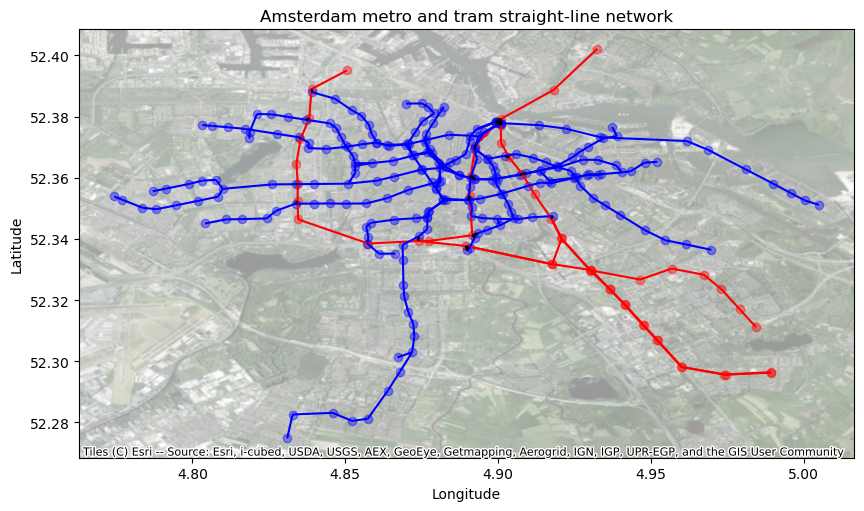

In [135]:
import contextily as ctx
city_sub_new_connected_edges_straight_line_gdf = gpd.GeoDataFrame(city_sub_new_connected_edges_straight_line.copy(), geometry='geometry')
city_tram_new_connected_edges_straight_line_gdf = gpd.GeoDataFrame(city_tram_new_connected_edges_straight_line.copy(), geometry='geometry')
connect_edges_sub_to_tram_oneway_gdf = gpd.GeoDataFrame(connect_edges_sub_to_tram_oneway_gdf.copy(), geometry='geometry')

fig, ax = plt.subplots(1, 1, figsize=(10, 6))

city_sub_new_half_stations_straight_line_gdf.plot(color='red', alpha=0.4, ax=ax, legend=True)
city_sub_new_connected_edges_straight_line_gdf.plot(color='red', ax=ax, legend=True)
city_tram_new_half_stations_straight_line_gdf.plot(color='blue', alpha=0.4, ax=ax, legend=True)
city_tram_new_connected_edges_straight_line_gdf.plot(color='blue', ax=ax, legend=True)
connect_edges_sub_to_tram_oneway_gdf.plot(color='black', ax=ax, legend=True)
metro_lines = gpd.read_file("./Metro lines.GPKG")
ctx.add_basemap(ax=ax, crs=metro_lines.crs.to_string(), source=ctx.providers.Esri.WorldImagery, alpha=0.4)

ax.set_title('Amsterdam metro and tram straight-line network')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')


plt.show()

# Create OD pairs

In [136]:
def get_first_last_points_route_dict(route_dict):
    origin_df = pd.DataFrame()
    for route_name, station_df in route_dict.items():
        first_last_points = station_df.iloc[[0, -1]]
        origin_df = pd.concat([origin_df, first_last_points])
    return origin_df


origin_df = pd.concat([get_first_last_points_route_dict(city_sub_new_half_order_route_dict),
                       get_first_last_points_route_dict(city_tram_new_half_order_route_dict)])


origin_df.drop_duplicates(subset='geometry', inplace=True)


selected_columns = ['geometry', 'name', 'id']
origin_id_df = origin_df[selected_columns].reset_index(drop=True)

In [137]:
# origin_df

In [138]:
origin_id_df

,geometry,name,id
0,POINT (4.9891612 52.2964067),Gein,328
1,POINT (4.8505958 52.3951031),Isolatorweg,805
2,POINT (4.9008686 52.3773546),Centraal Station,731
3,POINT (4.932402 52.4021571),Noord,630
4,POINT (4.8772326 52.3393181),Zuid,180
5,POINT (4.9843391 52.3111615),Gaasperplas,61
6,POINT (4.989299 52.2962711),Gein,323
7,POINT (4.9326128 52.3607965),Muiderpoortstation,2209
8,POINT (4.7745043 52.3538687),Matterhorn,1715
9,POINT (4.8992878 52.3783193),Centraal Station,2177


In [139]:
# destination_id_df = origin_id_df
# destination_id_df

In [140]:
# Repeat the combination
# OD_id_list = []

# for index_origin, row_origin in origin_id_df.iterrows():

       
#     for index_destination, row_destination in destination_id_df.iterrows():


#         if row_origin['name'] != row_destination['name']:
#             # Append a dictionary to the list
#             OD_id_list.append({
#                 's_id': row_origin['id'],
#                 'e_id': row_destination['id']
#              })

# # Create a DataFrame from the list of dictionaries
# OD_id_pairs_df = pd.DataFrame(OD_id_list)  

In [141]:
# OD_id_pairs_df

In [142]:
combinations_list = []
for (i1, row1), (i2, row2) in combinations(origin_id_df.iterrows(), 2):
    if row1['name'] != row2['name']:
        combinations_list.append((row1['id'], row2['id']))

# 转换为 DataFrame
OD_id_pairs_df = pd.DataFrame(combinations_list, columns=['s_id', 'e_id'])

In [143]:
OD_id_pairs_df

,s_id,e_id
0,328,805
1,328,731
2,328,630
3,328,180
4,328,61
...,...,...
519,1059,2036
520,1059,1090
521,2767,2036
522,2767,1090


# Test all OD in normal situation

## Load Graph with city_two_layer_network_nodes and city_two_layer_network_edges

In [144]:
city_two_layer_network_nodes = pd.concat([city_sub_new_nodes,city_tram_new_nodes])
city_two_layer_network_nodes.reset_index(drop=True,inplace=True)

In [145]:
city_two_layer_network_nodes

,id,geometry,degree
0,147,POINT (4.8338612 52.3645995),2
1,25,POINT (4.8338659 52.3643177),2
2,23,POINT (4.8338791 52.3637859),2
3,24,POINT (4.8339056 52.3629417),2
4,109,POINT (4.8339159 52.3625717),2
...,...,...,...
2064,2778,POINT (4.9009723 52.3777976),2
2065,2777,POINT (4.9009806 52.3777485),2
2066,2776,POINT (4.9009807 52.3777002),2
2067,1282,POINT (4.9373469 52.3768181),2


In [146]:
len(city_sub_new_half_stations_straight_line_gdf.copy().drop_duplicates(subset='name'))

39

In [147]:
len(city_tram_new_half_stations_straight_line_gdf.copy().drop_duplicates(subset='name'))

187

In [148]:
city_two_layer_network_stations = pd.concat([city_sub_new_half_stations_straight_line_gdf,city_tram_new_half_stations_straight_line_gdf])
city_two_layer_network_stations.reset_index(drop=True,inplace=True)

In [149]:
city_two_layer_network_stations

,geometry,id,degree,name,geo_x,geo_y,coordinate_value,route_name_list,route,ref,transfer
0,POINT (4.98916 52.29641),328,2,Gein,4.989161,52.296407,"(4.9891612, 52.2964067)",Metro 50: Gein => Isolatorweg,subway,"50, 54","50, 54"
1,POINT (4.974 52.29564),855,2,Reigersbos,4.974000,52.295637,"(4.9740002, 52.2956365)",Metro 50: Gein => Isolatorweg,subway,"50, 54","50, 54"
2,POINT (4.96013 52.29813),854,2,Holendrecht,4.960126,52.298132,"(4.9601264, 52.2981319)",Metro 50: Gein => Isolatorweg,subway,"50, 54","50, 54"
3,POINT (4.95213 52.30687),810,2,Bullewijk,4.952129,52.306869,"(4.9521292, 52.306869)",Metro 50: Gein => Isolatorweg,subway,"50, 54","50, 54"
4,POINT (4.94762 52.31181),809,2,Bijlmer ArenA,4.947618,52.311806,"(4.9476178, 52.311806)",Metro 50: Gein => Isolatorweg,subway,"50, 54","50, 54"
...,...,...,...,...,...,...,...,...,...,...,...
286,POINT (4.83128 52.37989),2526,2,Burgemeester Fockstraat,4.831279,52.379891,"(4.8312794, 52.3798913)",Tram 7: Amsterdam Azartplein => Amsterdam Slot...,tram,7,None
287,POINT (4.82581 52.38075),2533,2,Burgemeester Eliasstraat,4.825810,52.380750,"(4.8258104, 52.38075)",Tram 7: Amsterdam Azartplein => Amsterdam Slot...,tram,7,None
288,POINT (4.82116 52.38084),2528,2,Plein '40-'45,4.821159,52.380837,"(4.8211591, 52.3808373)",Tram 7: Amsterdam Azartplein => Amsterdam Slot...,tram,7,None
289,POINT (4.81875 52.37507),2509,2,Burgemeester Roëllstraat,4.818751,52.375067,"(4.8187509, 52.3750672)",Tram 7: Amsterdam Azartplein => Amsterdam Slot...,tram,7,None


In [150]:
len(city_sub_new_connected_edges_straight_line)

64

In [151]:
len(city_tram_new_connected_edges_straight_line)

307

In [152]:
len(connect_edges_sub_to_tram_oneway)

38

In [153]:
city_two_layer_network_edges = pd.concat([city_sub_new_connected_edges_straight_line,city_tram_new_connected_edges_straight_line,connect_edges_sub_to_tram_oneway])
city_two_layer_network_edges.reset_index(drop=True,inplace=True)

In [154]:
city_two_layer_network_edges

,geometry,from_id,to_id,route_name_list,distance,time,from_to,to_from,id
0,"LINESTRING (4.9891612 52.2964067, 4.9740002 52...",328,855,Metro 50: Gein => Isolatorweg,1693.527311,4,NaN,NaN,NaN
1,"LINESTRING (4.9740002 52.2956365, 4.9601264 52...",855,854,Metro 50: Gein => Isolatorweg,1609.832708,4,NaN,NaN,NaN
2,"LINESTRING (4.9601264 52.2981319, 4.9521292 52...",854,810,Metro 50: Gein => Isolatorweg,1822.740985,4,NaN,NaN,NaN
3,"LINESTRING (4.9521292 52.306869, 4.9476178 52....",810,809,Metro 50: Gein => Isolatorweg,1029.674063,2,NaN,NaN,NaN
4,"LINESTRING (4.9476178 52.311806, 4.9413977 52....",809,808,Metro 50: Gein => Isolatorweg,1419.649855,3,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...
404,"LINESTRING (4.8910469 52.3606866, 4.8909623 52...",861,2386,NaN,143.12934,15,"(861, 2386)","(2386, 861)",2695.0
405,"LINESTRING (4.9036061 52.3666363, 4.9022284 52...",459,2586,NaN,181.772452,15,"(459, 2586)","(2586, 459)",2696.0
406,"LINESTRING (4.9078472 52.3613094, 4.9091584 52...",460,2449,NaN,146.981525,15,"(460, 2449)","(2449, 460)",2697.0
407,"LINESTRING (4.9078472 52.3613094, 4.9071213 52...",460,2448,NaN,98.324093,15,"(460, 2448)","(2448, 460)",2698.0


In [155]:
city_two_layer_network_edges['from_to'] = city_two_layer_network_edges.apply(lambda row: (row['from_id'], row['to_id']), axis=1)
city_two_layer_network_edges['to_from'] = city_two_layer_network_edges.apply(lambda row: (row['to_id'], row['from_id']), axis=1)

In [156]:
G1 = nx.Graph()
for node_index, row in city_two_layer_network_stations.iterrows():
    geometry = row['geometry']
    node_id = row['id']
    x,y = geometry.x, geometry.y
    G1.add_node(node_id, pos = (x,y))

In [157]:
edges_for_G1 = city_two_layer_network_edges[['from_id', 'to_id', 'time', 'distance']]

for edges, row in edges_for_G1.iterrows():
    from_id = row['from_id']
    to_id = row['to_id']
    weight = row['time']
    G1.add_edge(from_id, to_id, weight = weight)

## Test all OD pairs

In [158]:
OD_shortest_path_nodes_id = {}
OD_shortest_path_edges = {}

for index, row in OD_id_pairs_df.iterrows():
    path_s_e, length_s_e, short_path_edges = shortest_path(G1, row.s_id, row.e_id, city_two_layer_network_edges, weight = "weight")
    OD_shortest_path_nodes_id[index] = path_s_e
    short_path_edges.drop_duplicates(subset='geometry', inplace=True)
    OD_shortest_path_edges[index] = short_path_edges

In [159]:
OD_shortest_path_edges

{0:                                              geometry from_id to_id  \
 0   LINESTRING (4.9891612 52.2964067, 4.9740002 52...     328   855   
 1   LINESTRING (4.9740002 52.2956365, 4.9601264 52...     855   854   
 2   LINESTRING (4.9601264 52.2981319, 4.9521292 52...     854   810   
 3   LINESTRING (4.9521292 52.306869, 4.9476178 52....     810   809   
 4   LINESTRING (4.9476178 52.311806, 4.9413977 52....     809   808   
 5   LINESTRING (4.9413977 52.3186119, 4.9365601 52...     808   852   
 6   LINESTRING (4.9365601 52.3236024, 4.9304544 52...     852   828   
 7   LINESTRING (4.9304544 52.3297847, 4.9176063 52...     828   838   
 8   LINESTRING (4.9176063 52.3317688, 4.889539 52....     838   857   
 9   LINESTRING (4.889539 52.337689, 4.8739633 52.3...     857   840   
 10  LINESTRING (4.8739633 52.3393223, 4.8575709 52...     840   835   
 11  LINESTRING (4.8575709 52.3384751, 4.8345741 52...     835   841   
 12  LINESTRING (4.8345741 52.3463868, 4.834401 52....     84

In [160]:
OD_shortest_path_nodes_id

{0: [np.int64(328),
  855,
  854,
  810,
  809,
  808,
  852,
  828,
  838,
  857,
  840,
  835,
  841,
  19,
  843,
  848,
  846,
  844,
  121,
  np.int64(805)],
 1: [np.int64(328),
  855,
  854,
  810,
  809,
  808,
  852,
  828,
  826,
  830,
  819,
  260,
  460,
  459,
  867,
  np.int64(731)],
 2: [np.int64(328),
  855,
  854,
  810,
  809,
  808,
  852,
  828,
  838,
  857,
  840,
  180,
  860,
  863,
  861,
  813,
  816,
  818,
  np.int64(630)],
 3: [np.int64(328),
  855,
  854,
  810,
  809,
  808,
  852,
  828,
  838,
  857,
  840,
  np.int64(180)],
 4: [np.int64(328),
  855,
  854,
  810,
  809,
  808,
  852,
  828,
  826,
  811,
  822,
  54,
  56,
  812,
  np.int64(61)],
 5: [np.int64(328),
  855,
  854,
  810,
  809,
  808,
  852,
  828,
  826,
  830,
  819,
  260,
  460,
  2448,
  2466,
  2480,
  2474,
  2371,
  np.int64(2209)],
 6: [np.int64(328),
  855,
  854,
  810,
  809,
  808,
  852,
  828,
  838,
  857,
  840,
  835,
  841,
  19,
  843,
  2654,
  2648,
  2652,
  2651

In [161]:
len(OD_shortest_path_edges)

524

## Mean time and distance

In [162]:
def od_time_distance_df(OD_shortest_path_edges):
    for od,edges_df in OD_shortest_path_edges.items():
        edges_df['total_time'] = edges_df['time'].sum()
        edges_df['total_distance'] = edges_df['distance'].sum()
    
    result_df = pd.DataFrame()
    
    for od,edges_df in OD_shortest_path_edges.items():
    
        first_row = edges_df.iloc[0]
        result_df = pd.concat([result_df,first_row.to_frame().T])
        
    result_df.index = OD_shortest_path_edges.keys()
    result_df = result_df[['total_time','total_distance']]
    result_df['od_num'] = result_df.index
    result_df.reset_index(drop=True,inplace=True)
    
    mean_time = result_df['total_time'].mean()
    mean_distance = result_df['total_distance'].mean()
    od_pair_amount = len(result_df)
    mean_result_df = pd.DataFrame({'mean_time': [mean_time],'mean_distance': [mean_distance], 'od_amount': [od_pair_amount]})    
         
    return result_df, mean_result_df

In [163]:
od_time_distance_result_df, od_time_distance_mean_result_df = od_time_distance_df(OD_shortest_path_edges)

In [164]:
od_time_distance_result_df

,total_time,total_distance,od_num
0,74,30784.762123,0
1,61,19352.281017,1
2,88,31184.993848,2
3,54,16850.88744,3
4,58,18062.680145,4
...,...,...,...
519,89,20760.708573,519
520,99,22915.498537,520
521,50,11823.351317,521
522,60,13978.14128,522


In [165]:
od_time_distance_mean_result_df

,mean_time,mean_distance,od_amount
0,70.849237,15949.323103,524


## Number of times an edge is used

In [166]:
# OD_shortest_path_edges_df = pd.DataFrame()

# for od,edges_df in OD_shortest_path_edges.items():

#     OD_shortest_path_edges_df = pd.concat([OD_shortest_path_edges_df,edges_df])

# OD_shortest_path_edges_value_counts = OD_shortest_path_edges_df['from_to'].value_counts()
# OD_shortest_path_edges_value_counts_df = OD_shortest_path_edges_value_counts.reset_index()
# # OD_shortest_path_edges_value_counts_df.columns = ['geometry', 'count_number']

In [167]:
# OD_shortest_path_edges_value_counts_df

In [168]:
def edges_used_time_count(OD_shortest_path_edges,city_two_layer_network_edges):
    OD_shortest_path_edges_df = pd.DataFrame()

    for od,edges_df in OD_shortest_path_edges.items():
    
        OD_shortest_path_edges_df = pd.concat([OD_shortest_path_edges_df,edges_df])
    
    OD_shortest_path_edges_value_counts = OD_shortest_path_edges_df['geometry'].value_counts()
    OD_shortest_path_edges_value_counts_df = OD_shortest_path_edges_value_counts.reset_index()
    OD_shortest_path_edges_value_counts_all_df = pd.merge(OD_shortest_path_edges_value_counts_df,city_two_layer_network_edges,on='geometry',how='left')
    return OD_shortest_path_edges_value_counts_all_df

In [169]:
OD_shortest_path_edges_value_counts_all_df = edges_used_time_count(OD_shortest_path_edges,city_two_layer_network_edges)

In [170]:
OD_shortest_path_edges_value_counts_all_df

,geometry,count,from_id,to_id,route_name_list,distance,time,from_to,to_from,id
0,"LINESTRING (4.8930014 52.3758615, 4.8908314 52...",100,2550,2481,Tram 12: Amsterdam Centraal Station => Amsterd...,454.369304,2,"(2550, 2481)","(2481, 2550)",NaN
1,"LINESTRING (4.9174059 52.3466361, 4.9206141 52...",78,819,830,Metro 51: Centraal Station => Isolatorweg,1227.507074,3,"(819, 830)","(830, 819)",NaN
2,"LINESTRING (4.8837739 52.3740565, 4.8763385 52...",70,2539,2530,Tram 13: Amsterdam Centraal Station => Amsterd...,885.135006,4,"(2539, 2530)","(2530, 2539)",NaN
3,"LINESTRING (4.8908314 52.373751, 4.8837739 52....",70,2481,2539,Tram 12: Amsterdam Centraal Station => Amsterd...,787.609675,3,"(2481, 2539)","(2539, 2481)",NaN
4,"LINESTRING (4.9078472 52.3613094, 4.9118953 52...",64,460,260,Metro 51: Centraal Station => Isolatorweg,1310.157512,3,"(460, 260)","(260, 460)",NaN
...,...,...,...,...,...,...,...,...,...,...
353,"LINESTRING (4.8906476 52.3539585, 4.8901771 52...",1,863,2722,NaN,239.377914,15,"(863, 2722)","(2722, 863)",2681.0
354,"LINESTRING (4.9326128 52.3607965, 4.9336328 52...",1,2209,1840,NaN,132.855253,15,"(2209, 1840)","(1840, 2209)",2646.0
355,"LINESTRING (4.9071213 52.3610021, 4.9091584 52...",1,2448,2449,NaN,238.320596,15,"(2448, 2449)","(2449, 2448)",2635.0
356,"LINESTRING (4.8993575 52.3783416, 4.9009769 52...",1,2178,1658,NaN,201.273991,15,"(2178, 1658)","(1658, 2178)",2609.0


In [171]:
# OD_shortest_path_edges_df = pd.DataFrame()

# for od,edges_df in OD_shortest_path_edges.items():

#     OD_shortest_path_edges_df = pd.concat([OD_shortest_path_edges_df,edges_df])

# OD_shortest_path_edges_value_counts = OD_shortest_path_edges_df['geometry'].value_counts()
# OD_shortest_path_edges_value_counts_df = OD_shortest_path_edges_value_counts.reset_index()
# # OD_shortest_path_edges_value_counts_df.columns = ['geometry', 'count_number']

In [172]:
# OD_shortest_path_edges_value_counts_df

In [173]:
# OD_shortest_path_edges_value_counts_all_df = pd.merge(OD_shortest_path_edges_value_counts_df,city_two_layer_network_edges,on='geometry',how='left')

In [174]:
# OD_shortest_path_edges_value_counts_all_df

## Output results in QGIS and Excel

In [175]:
# od_33 = OD_shortest_path_edges[33]
# gpd.GeoDataFrame(od_33[['geometry','from_id','to_id','route_name_list','distance','time']]).to_file('od_33_0702.GPKG',driver='GPKG')

In [176]:
# od_107 = OD_shortest_path_edges[107]
# gpd.GeoDataFrame(od_107[['geometry','from_id','to_id','route_name_list','distance','time']]).to_file('od_107_0702.GPKG',driver='GPKG')

In [177]:
# od_247 = OD_shortest_path_edges[247]
# gpd.GeoDataFrame(od_247[['geometry','from_id','to_id','route_name_list','distance','time']]).to_file('od_247_0702.GPKG',driver='GPKG')

In [178]:
# od_300 = OD_shortest_path_edges[300]
# gpd.GeoDataFrame(od_300[['geometry','from_id','to_id','route_name_list','distance','time']]).to_file('od_300_0702.GPKG',driver='GPKG')

In [179]:
# gpd.GeoDataFrame(city_sub_new_half_stations_straight_line_gdf[['id', 'geometry','name','geo_x','geo_y','route_name_list','ref','transfer','route']]).to_file('city_sub_new_half_stations_straight_line_df0702.GPKG',driver='GPKG')
# gpd.GeoDataFrame(city_sub_new_connected_edges_straight_line[['geometry', 'from_id', 'to_id', 'route_name_list', 'distance', 'time']]).to_file('city_sub_new_connected_edges_straight_line0702.GPKG',driver='GPKG')

In [180]:
# gpd.GeoDataFrame(city_tram_new_half_stations_straight_line_gdf[['id', 'geometry','name','geo_x','geo_y','route_name_list','ref','transfer','route']]).to_file('city_tram_new_half_stations_straight_line_df0702.GPKG',driver='GPKG')
# gpd.GeoDataFrame(city_tram_new_connected_edges_straight_line[['geometry', 'from_id', 'to_id', 'route_name_list', 'distance', 'time']]).to_file('city_tram_new_connected_edges_straight_line0702.GPKG',driver='GPKG')

In [181]:
# gpd.GeoDataFrame(connect_edges_sub_to_tram_oneway[['geometry', 'from_id', 'to_id', 'distance', 'time']]).to_file('connect_edges_sub_to_tram_oneway0702.GPKG',driver='GPKG')

In [182]:
# city_sub_new_half_stations_straight_line_gdf[['id','geo_x','geo_y','route_name_list','ref']].to_excel('city_sub_new_half_stations_straight_line_df0702.xlsx',header = True,index = False)

In [183]:
# city_tram_new_half_stations_straight_line_gdf[['id','geo_x','geo_y','route_name_list','ref']].to_excel('city_tram_new_half_stations_straight_line_df0702.xlsx',header = True,index = False)

In [184]:
# city_sub_new_connected_edges_straight_line[['from_id', 'to_id', 'route_name_list','distance', 'time']].to_excel('city_sub_new_connected_edges_straight_line0702.xlsx',header = True,index = False)

In [185]:
# city_tram_new_connected_edges_straight_line[['from_id', 'to_id', 'route_name_list','distance', 'time']].to_excel('city_tram_new_connected_edges_straight_line0702.xlsx',header = True,index = False)

In [186]:
# connect_edges_sub_to_tram_oneway[['from_id', 'to_id','distance', 'time']].to_excel('connect_edges_sub_to_tram_oneway0702.xlsx',header = True,index = False)

In [187]:
# len(city_sub_new_half_stations_straight_line_df)

In [188]:
# len(city_tram_new_half_stations_straight_line_df)

In [189]:
# len(city_sub_new_connected_edges_straight_line)

In [190]:
# len(city_tram_new_connected_edges_straight_line)

In [191]:
# len(connect_edges_sub_to_tram_oneway)

# Station Disruption simulation

## Read gpkg file which combine the flood data with station node dataframe

In [192]:
def new_half_stations_flood_depth(gpkg_file_route):
    city_sub_new_half_stations_flood_probability = gpd.read_file(gpkg_file_route)
    reseted_columns = ['geometry','id','name','flood_depth1']
    one_rp_flood_all_depth_city_sub_new_half_stations = city_sub_new_half_stations_flood_probability[reseted_columns]
    return one_rp_flood_all_depth_city_sub_new_half_stations

In [193]:
gpkg_file_route_10_sub = "C:\\projects\\UTNCE\\data\\10rp_city_sub_new_half_stations.GPKG"
rp10_flood_city_sub_new_half_stations = new_half_stations_flood_depth(gpkg_file_route_10_sub)
rp10_flood_city_sub_new_half_stations = rp10_flood_city_sub_new_half_stations[rp10_flood_city_sub_new_half_stations.flood_depth1 > 0.3]

In [194]:
gpkg_file_route_100_sub = "C:\\projects\\UTNCE\\data\\100rp_city_sub_new_half_stations.GPKG"
rp100_flood_city_sub_new_half_stations = new_half_stations_flood_depth(gpkg_file_route_100_sub)
rp100_flood_city_sub_new_half_stations = rp100_flood_city_sub_new_half_stations[rp100_flood_city_sub_new_half_stations.flood_depth1 > 0.3]

In [195]:
gpkg_file_route_1000_sub = "C:\\projects\\UTNCE\\data\\1000rp_city_sub_new_half_stations.GPKG"
rp1000_flood_city_sub_new_half_stations = new_half_stations_flood_depth(gpkg_file_route_1000_sub)
rp1000_flood_city_sub_new_half_stations = rp1000_flood_city_sub_new_half_stations[rp1000_flood_city_sub_new_half_stations.flood_depth1 > 0.3]

In [196]:
gpkg_file_route_10000_sub = "C:\\projects\\UTNCE\\data\\10000rp_city_sub_new_half_stations.GPKG"
rp10000_flood_city_sub_new_half_stations = new_half_stations_flood_depth(gpkg_file_route_10000_sub)
rp10000_flood_city_sub_new_half_stations = rp10000_flood_city_sub_new_half_stations[rp10000_flood_city_sub_new_half_stations.flood_depth1 > 0.3]

In [197]:
gpkg_file_route_100000_sub = "C:\\projects\\UTNCE\\data\\100000rp_city_sub_new_half_stations.GPKG"
rp100000_flood_city_sub_new_half_stations = new_half_stations_flood_depth(gpkg_file_route_100000_sub)
rp100000_flood_city_sub_new_half_stations = rp100000_flood_city_sub_new_half_stations[rp100000_flood_city_sub_new_half_stations.flood_depth1 > 0.3]

## Get dictionary to restore the disrupted stations dataframes sorted by flood return period

In [198]:
r_flood_stations_dic = {
                        'r_100000': rp100000_flood_city_sub_new_half_stations,
                        'r_10000': rp10000_flood_city_sub_new_half_stations,
                        'r_1000': rp1000_flood_city_sub_new_half_stations,
                        'r_100': rp100_flood_city_sub_new_half_stations,
                        'r_10': rp10_flood_city_sub_new_half_stations
}

In [199]:
r_flood_stations_dic

{'r_100000':                     geometry   id               name  flood_depth1
 3   POINT (4.95213 52.30687)  810          Bullewijk        1.1256
 5    POINT (4.9414 52.31861)  808        Strandvliet        1.1440
 12  POINT (4.83457 52.34639)  841  Henk Sneevlietweg        0.4496
 13   POINT (4.8344 52.35233)   19    Heemstedestraat        0.4203
 14  POINT (4.83447 52.35806)  843           Lelylaan        1.7020
 15   POINT (4.83403 52.3646)  848         Postjesweg        1.6420
 26   POINT (4.9208 52.34023)  831         Spaklerweg        1.4343
 28   POINT (4.9324 52.40216)  630              Noord        2.2700
 29   POINT (4.91811 52.3887)  818        Noorderpark        0.9500
 30  POINT (4.90088 52.37921)  816   Centraal Station        1.3689
 31  POINT (4.89256 52.37054)  813              Rokin        0.5523
 36  POINT (4.92061 52.34019)  830         Spaklerweg        1.4343
 41  POINT (4.97289 52.32368)   56         Ganzenhoef        1.8322
 42  POINT (4.97901 52.31698)  812  

## Prepare dictionaries and calculate shortest path under different disruption scenarios 

In [200]:
def station_disruption_pre_results_r_d(city_sub_stations_flood_r_dict, city_two_layer_network_edges, city_two_layer_network_stations):
    disrupted_stations_dict = {}
    disrupted_edges_dict = {}
    remained_stations_dict = {}
    remained_edges_dict = {}
    
    for r_d, disrupted_stations_df in city_sub_stations_flood_r_dict.items():
        # Merge disrupted stations with the network stations to find common stations
        merged_stations = pd.merge(disrupted_stations_df, city_two_layer_network_stations, on='geometry')
        merged_stations.drop(columns=['id_y', 'name_y'], inplace=True)
        merged_stations.rename(columns={'id_x': 'id', 'name_x': 'name'}, inplace=True)
        
        disrupted_stations_id_list = list(merged_stations.id)
        
        # Find disrupted edges based on disrupted stations
        disrupted_edges = city_two_layer_network_edges[
            city_two_layer_network_edges['from_id'].isin(disrupted_stations_id_list) | 
            city_two_layer_network_edges['to_id'].isin(disrupted_stations_id_list)
        ]
        
        # Filter out disrupted stations
        remained_stations = city_two_layer_network_stations[
            ~city_two_layer_network_stations['geometry'].isin(merged_stations['geometry'])
        ]
        
        # Filter out disrupted edges
        remained_edges = city_two_layer_network_edges[
            ~city_two_layer_network_edges['geometry'].isin(disrupted_edges['geometry'])
        ]
        
        # Store the results for each r_d
        disrupted_stations_dict[r_d] = merged_stations
        disrupted_edges_dict[r_d] = disrupted_edges
        remained_stations_dict[r_d] = remained_stations
        remained_edges_dict[r_d] = remained_edges
    
    return disrupted_stations_dict, disrupted_edges_dict, remained_stations_dict, remained_edges_dict

In [201]:
disrupted_stations_sub, disrupted_edges_sub, remained_stations_sub, remained_edges_sub = station_disruption_pre_results_r_d (r_flood_stations_dic, city_two_layer_network_edges, city_two_layer_network_stations)

In [202]:
def station_disruption_od_result_r_d(remained_stations_sub, remained_edges_sub, OD_id_pairs_df):
    od_time_distance_dict = {}
    od_mean_dict = {}
    edges_count_dict = {}
    shortest_ids_dict = {}
    shortest_paths_dict = {}

    for r_d, df in remained_stations_sub.items():
        # Create a new graph
        G2 = nx.Graph()
        
        # Add nodes to the graph
        for node_index, row in df.iterrows():
            geometry = row['geometry']
            node_id = row['id']
            x, y = geometry.x, geometry.y
            G2.add_node(node_id, pos=(x, y))
        
        # Add edges to the graph
        edges_for_G2 = remained_edges_sub[r_d][['from_id', 'to_id', 'time', 'distance']]
        for edges_index, row in edges_for_G2.iterrows():
            from_id = row['from_id']
            to_id = row['to_id']
            weight = row['time']
            G2.add_edge(from_id, to_id, weight=weight)  
        
        OD_shortest_path_nodes_id = {}
        OD_shortest_path_edges = {}
        
        # Calculate shortest paths for each OD pair
        for index, row in OD_id_pairs_df.iterrows():
            try:
                path_s_e, length_s_e, short_path_edges = shortest_path(G2, row.s_id, row.e_id, remained_edges_sub[r_d], weight="weight")
                OD_shortest_path_nodes_id[index] = path_s_e
                short_path_edges.drop_duplicates(subset='geometry', inplace=True)
                OD_shortest_path_edges[index] = short_path_edges
            except nx.NodeNotFound:
                continue  # Skip silently if the node is not found
            except nx.NetworkXNoPath:
                continue  # Skip silently if there is no path
        
        od_time_distance_result_df, od_time_distance_mean_result_df = od_time_distance_df(OD_shortest_path_edges)
        od_time_distance_dict[r_d] = od_time_distance_result_df
        od_mean_dict[r_d] = od_time_distance_mean_result_df
        
        OD_shortest_path_edges_value_counts_all_df = edges_used_time_count(OD_shortest_path_edges,city_two_layer_network_edges)
        edges_count_dict[r_d] = OD_shortest_path_edges_value_counts_all_df
        
        # Assign the shortest path edges to the dictionary for the current probability category
        shortest_ids_dict[r_d] = OD_shortest_path_nodes_id
        shortest_paths_dict[r_d] = OD_shortest_path_edges
    return od_time_distance_dict, od_mean_dict, edges_count_dict, shortest_ids_dict, shortest_paths_dict

In [203]:
od_time_distance_dict, od_mean_dict, edges_count_dict, shortest_ids_dict, shortest_paths_dict = station_disruption_od_result_r_d(remained_stations_sub, remained_edges_sub, OD_id_pairs_df)

## Compare changes in all OD pairs

In [204]:
def compare_time_distance_difference(od_time_distance_result_df, dep_diff_prob_shortest_path_dict):
    diff_time_distance_dict = {}
    for prob_category,shortest_path_dict in dep_diff_prob_shortest_path_dict.items():
        result_df, mean_result_df = od_time_distance_df(shortest_path_dict)
        df1 = od_time_distance_result_df
        df2 = result_df
        merged_df = pd.merge(df1, df2, on='od_num', suffixes=('_df1', '_df2'))

        diff_df = merged_df[merged_df['total_time_df1'] != merged_df['total_time_df2']]
        diff_df['diff_total_time'] = diff_df['total_time_df2'] - diff_df['total_time_df1']
        diff_df['diff_total_distance'] = diff_df['total_distance_df2'] - diff_df['total_distance_df1']
        diff_df = diff_df.sort_values(by='diff_total_time')
        diff_time_distance_dict[prob_category] = diff_df
    return diff_time_distance_dict

In [205]:
diff_time_distance_dict = compare_time_distance_difference(od_time_distance_result_df, shortest_paths_dict)

In [206]:
diff_time_distance_dict

{'r_100000':     total_time_df1 total_distance_df1  od_num total_time_df2  \
 155             59       11244.101931     280             61   
 116            145       30341.080495     241            148   
 117             78       14530.397906     242             81   
 123            111       22347.771859     248            114   
 139             51        8415.673919     264             54   
 ..             ...                ...     ...            ...   
 257             74       12192.781414     382            100   
 1               50       14661.749915      34             85   
 23              54       16326.132732      58             93   
 15              52       12290.654934      50             96   
 17              52       13825.902461      52             99   
 
     total_distance_df2 diff_total_time diff_total_distance  
 155       10838.709381               2          -405.39255  
 116       34450.857752               3         4109.777258  
 117       18640.175

In [207]:
od_com = pd.DataFrame()

for key, values in od_mean_dict.items():
    df1 = values
    df1['scenario'] = key
    new_column_order = ['scenario', 'mean_time', 'mean_distance', 'od_amount']
    df1 = df1[new_column_order]
    df1['disrupted_od_amount'] = 524 - df1['od_amount']
    df1['changing_time_od_amount'] = len(diff_time_distance_dict[key]) + df1['disrupted_od_amount']
    df1['increasing_time_od_amount'] = len(diff_time_distance_dict[key])
    
    df1['increasing_total_time'] = diff_time_distance_dict[key].diff_total_time.sum()
    df1['increasing_time_vs_od'] = df1['increasing_total_time'] / df1['increasing_time_od_amount']
    od_com = pd.concat([od_com, df1], ignore_index=True)

od_com = od_com.iloc[::-1].reset_index(drop=True)

od_time_distance_mean_result_df['scenario'] = 'r_0'
od_time_distance_mean_result_df['disrupted_od_amount'] = 524 - od_time_distance_mean_result_df['od_amount']
od_time_distance_mean_result_df['changing_time_od_amount'] = 0
od_time_distance_mean_result_df['increasing_time_od_amount'] = 0
od_time_distance_mean_result_df['increasing_total_time'] = 0
od_time_distance_mean_result_df['increasing_time_vs_od'] = 0
od_time_distance_mean_result_df = od_time_distance_mean_result_df[['scenario','mean_time','mean_distance','od_amount','disrupted_od_amount','increasing_time_od_amount','increasing_total_time','increasing_time_vs_od']]

od_com = pd.concat([od_time_distance_mean_result_df,od_com]).reset_index(drop=True)
od_com.fillna(0, inplace=True)
od_com

,scenario,mean_time,mean_distance,od_amount,disrupted_od_amount,increasing_time_od_amount,increasing_total_time,increasing_time_vs_od,changing_time_od_amount
0,r_0,70.849237,15949.323103,524,0,0,0,0.000000,0.0
1,r_10,70.849237,15949.323103,524,0,0,0,0.000000,0.0
2,r_100,71.243478,15053.120025,460,64,51,796,15.607843,115.0
3,r_1000,71.002331,14536.112896,429,95,57,851,14.929825,152.0
4,r_10000,71.002331,14536.112896,429,95,57,851,14.929825,152.0
5,r_100000,72.205514,14580.226950,399,125,74,1020,13.783784,199.0


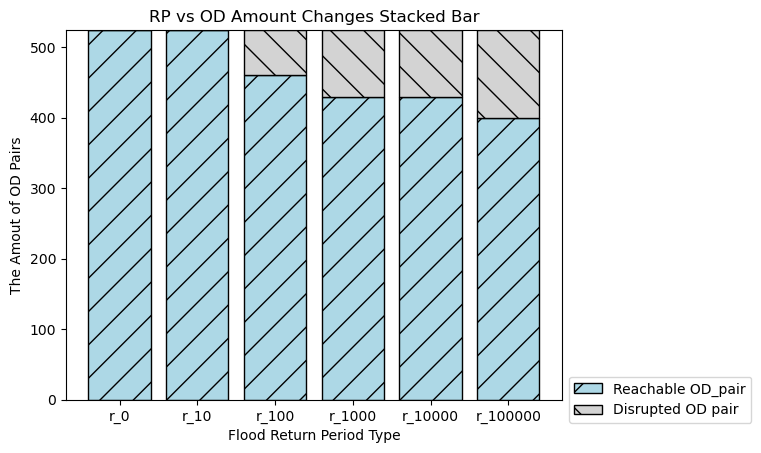

In [208]:
# Create a graph
fig, ax = plt.subplots()

# Draw a stacked bar chart
ax.bar(list(od_com.scenario), list(od_com.od_amount), label='Reachable OD_pair', color='lightblue', edgecolor='black', hatch='/')  # 用斜线填充
ax.bar(list(od_com.scenario), list(od_com.disrupted_od_amount), bottom=list(od_com.od_amount), label='Disrupted OD pair', color='lightgrey', edgecolor='black', hatch='\\')  # 用反斜线填充

# Set labels and title
ax.set_xlabel('Flood Return Period Type')
ax.set_ylabel('The Amout of OD Pairs')
ax.set_title('RP vs OD Amount Changes Stacked Bar')

# Show legend outside the plot area on the lower right corner
ax.legend(loc='center left', bbox_to_anchor=(1, 0))
# Show graph
plt.show()

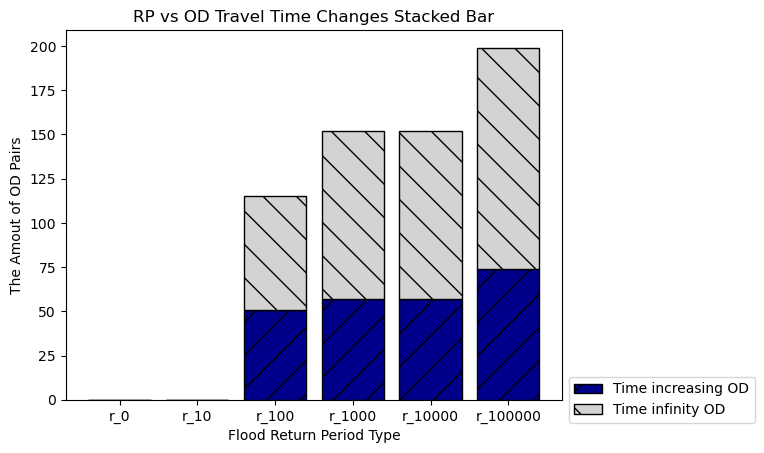

In [209]:
# Create a graph
fig, ax = plt.subplots()

# Draw a stacked bar chart
# ax.bar(list(od_com.scenario), list(od_com.od_amount), label='Time remains OD', color='lightblue', edgecolor='black', hatch='/')  # 用斜线填充
ax.bar(list(od_com.scenario), list(od_com.increasing_time_od_amount	), label='Time increasing OD',color='darkblue', edgecolor='black', hatch='/')  # 用斜线填充
ax.bar(list(od_com.scenario), list(od_com.disrupted_od_amount), bottom=list(od_com.increasing_time_od_amount), label='Time infinity OD', color='lightgrey', edgecolor='black', hatch='\\')  # 用反斜线填充

# Set labels and title
ax.set_xlabel('Flood Return Period Type')
ax.set_ylabel('The Amout of OD Pairs')
ax.set_title('RP vs OD Travel Time Changes Stacked Bar')

# Show legend outside the plot area on the lower right corner
ax.legend(loc='center left', bbox_to_anchor=(1, 0))
# Show graph
plt.show()

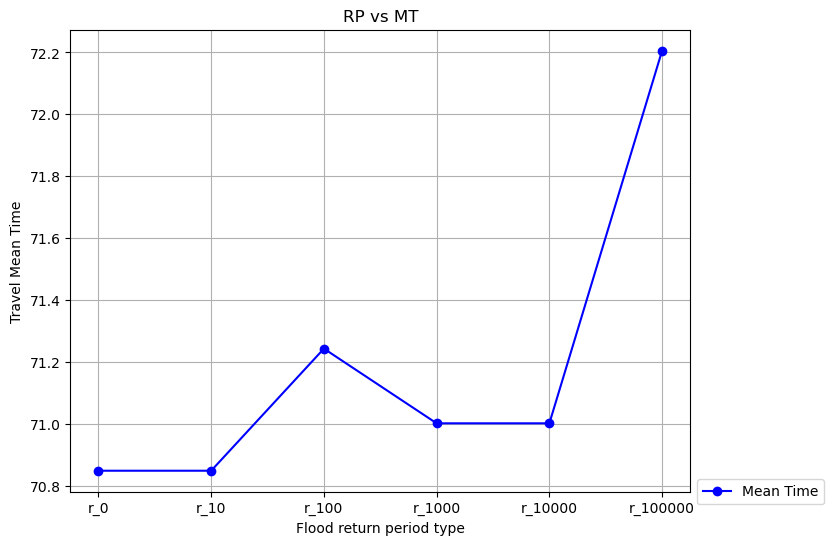

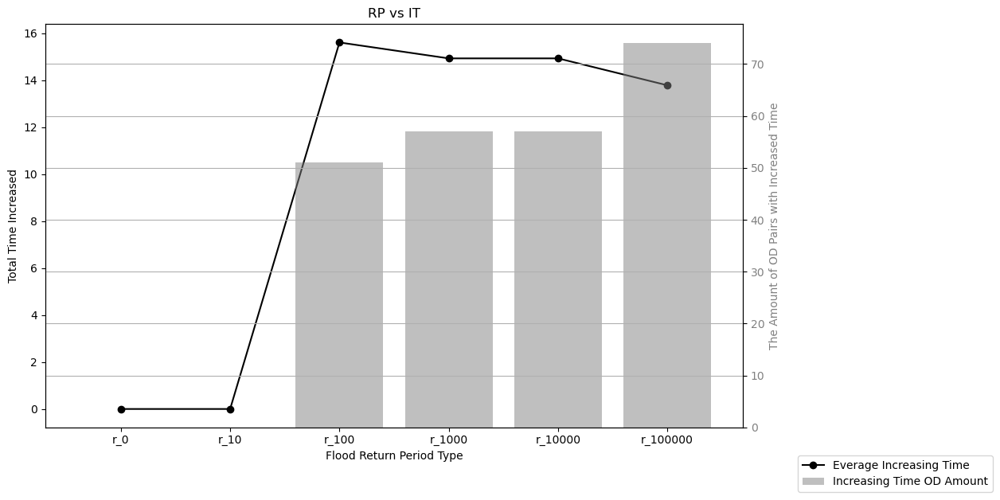

In [210]:
# Draw the first graph: a line graph of mean_time
plt.figure(figsize=(8, 6))
plt.plot(od_com['scenario'], od_com['mean_time'], marker='o', color='blue', label='Mean Time')
plt.xlabel('Flood return period type')
plt.ylabel('Travel Mean Time')
plt.title('RP vs MT')
plt.legend(loc='center left', bbox_to_anchor=(1, 0))
plt.grid(True)
plt.show()

# Draw a second graph: a line graph of increasing_total_time and a bar graph of increasing_time_od_amount
fig, ax1 = plt.subplots(figsize=(10, 6))

# Draw a line chart of increasing_total_time
ax1.plot(od_com['scenario'], od_com['increasing_time_vs_od'], color='black', marker='o', label='Everage Increasing Time')
ax1.set_xlabel('Flood Return Period Type')
ax1.set_ylabel('Total Time Increased', color='black')
ax1.tick_params(axis='y', labelcolor='black')

# Create a second Y axis for drawing a bar chart
ax2 = ax1.twinx()
ax2.bar(od_com['scenario'], od_com['increasing_time_od_amount'], color='gray', alpha=0.5, label='Increasing Time OD Amount')
ax2.set_ylabel('The Amount of OD Pairs with Increased Time', color='gray')
ax2.tick_params(axis='y', labelcolor='gray')

# Combine legends
lines_labels = [ax.get_legend_handles_labels() for ax in [ax1, ax2]]
lines, labels = [sum(lol, []) for lol in zip(*lines_labels)]
fig.legend(lines, labels, loc='center left', bbox_to_anchor=(1, 0))

plt.title('RP vs IT')
plt.grid(True)
plt.tight_layout()  # Adjust the layout to make room for the legend
plt.show()

## Compare changes in all stations

In [211]:
from collections import Counter

node_frequency_dict = {}
for key, values in shortest_ids_dict.items():
    nodes_lists = []
    for od_num, nodes_list in values.items():
        nodes_lists.extend(nodes_list)
    counts = Counter(nodes_lists)
    df = pd.DataFrame(list(counts.items()), columns=['node_id', 'frequency'])
    df = df.sort_values(by='frequency').reset_index(drop=True)
    node_frequency_dict[key] = df
    
node_frequency_dict

{'r_100000':      node_id  frequency
 0        857          4
 1        835          5
 2        260          9
 3        819          9
 4       2513         11
 ..       ...        ...
 251     2530         83
 252     2568         93
 253     2739         94
 254     2550        109
 255     2481        127
 
 [256 rows x 2 columns],
 'r_10000':      node_id  frequency
 0       2431          2
 1       2741          2
 2       2584          2
 3       2585          2
 4        857          4
 ..       ...        ...
 255     2300         86
 256     2739         90
 257     2568         94
 258     2550        105
 259     2481        123
 
 [260 rows x 2 columns],
 'r_1000':      node_id  frequency
 0       2431          2
 1       2741          2
 2       2584          2
 3       2585          2
 4        857          4
 ..       ...        ...
 255     2300         86
 256     2739         90
 257     2568         94
 258     2550        105
 259     2481        123
 
 [260 rows 

In [212]:
# Count the usage of stations when no flood occurs
# Merge all node IDs into a list
used_stations_amount_list = []
for od_num, id_list in OD_shortest_path_nodes_id.items():
    used_stations_amount_list.extend(id_list)

# Count the usage frequency of nodes
counts = Counter(used_stations_amount_list)
nor_used_station_frequency_df = pd.DataFrame(list(counts.items()), columns=['node_id', 'frequency'])
nor_used_station_frequency_df = nor_used_station_frequency_df.sort_values(by='frequency').reset_index(drop=True)

# Initialize nor_station_df DataFrame
nor_station_df = pd.DataFrame()

# Add data to DataFrame
nor_station_df['scenarios'] = ['r_0']  # Note that it is passed in list form here
nor_station_df['unflooded_stations_amount'] = [len(city_two_layer_network_stations)]
nor_station_df['disrupted_stations_amount'] = [0]
nor_station_df['used_stations_amount'] = [len(nor_used_station_frequency_df)]



# Count the usage of stations when flood occurs
station_com = pd.DataFrame()

for flood_r, dfs in node_frequency_dict.items():
    dfs['scenarios'] = flood_r
    dfs['unflooded_stations_amount'] = len(remained_stations_sub[flood_r])
    dfs['disrupted_stations_amount'] = len(disrupted_stations_sub[flood_r])
    dfs['used_stations_amount'] = len(dfs)
    
    station_com = pd.concat([station_com, dfs], ignore_index=True)
    station_com = station_com[['scenarios', 'unflooded_stations_amount', 'disrupted_stations_amount', 'used_stations_amount']].drop_duplicates(subset='scenarios').reset_index(drop=True)
station_com = station_com.iloc[::-1].reset_index(drop=True)


# Combine them together
station_com = pd.concat([nor_station_df, station_com]).reset_index(drop=True)
station_com

,scenarios,unflooded_stations_amount,disrupted_stations_amount,used_stations_amount
0,r_0,291,0,291
1,r_10,291,0,291
2,r_100,288,3,272
3,r_1000,279,12,260
4,r_10000,279,12,260
5,r_100000,275,16,256


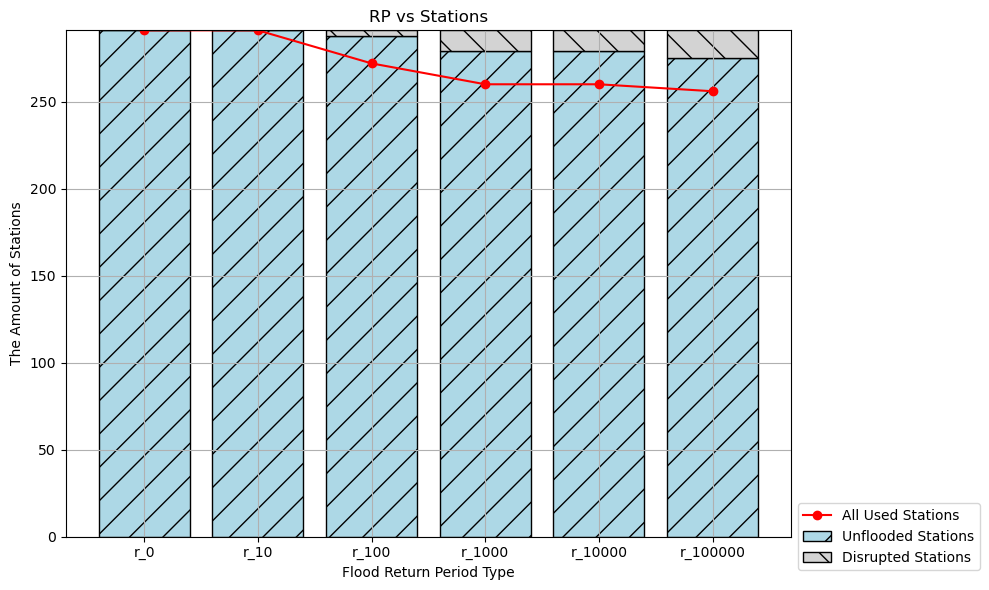

In [213]:
fig, ax1 = plt.subplots(figsize=(10, 6))

# Draw a stacked bar chart
ax1.bar(list(station_com.scenarios), list(station_com.unflooded_stations_amount), label='Unflooded Stations', color='lightblue', edgecolor='black', hatch='/')  # 用斜线填充
ax1.bar(list(station_com.scenarios), list(station_com.disrupted_stations_amount), bottom=list(station_com.unflooded_stations_amount), label='Disrupted Stations', color='lightgrey', edgecolor='black', hatch='\\')  
ax1.plot(list(station_com.scenarios), list(station_com.used_stations_amount), color='red', marker='o', label='All Used Stations')
ax1.set_xlabel('Flood Return Period Type')
ax1.set_ylabel('The Amount of Stations', color='black')
ax1.tick_params(axis='y', labelcolor='black')
ax1.legend(loc='center left', bbox_to_anchor=(1, 0))

plt.title('RP vs Stations')
plt.grid(True)
plt.tight_layout()  # Adjust the layout to make room for the legend
plt.show()

In [214]:
for key in node_frequency_dict:
    node_frequency_dict[key] = node_frequency_dict[key].iloc[:, :-4]
node_frequency_dict['r_0'] = nor_used_station_frequency_df
node_frequency_dict

{'r_100000':      node_id  frequency
 0        857          4
 1        835          5
 2        260          9
 3        819          9
 4       2513         11
 ..       ...        ...
 251     2530         83
 252     2568         93
 253     2739         94
 254     2550        109
 255     2481        127
 
 [256 rows x 2 columns],
 'r_10000':      node_id  frequency
 0       2431          2
 1       2741          2
 2       2584          2
 3       2585          2
 4        857          4
 ..       ...        ...
 255     2300         86
 256     2739         90
 257     2568         94
 258     2550        105
 259     2481        123
 
 [260 rows x 2 columns],
 'r_1000':      node_id  frequency
 0       2431          2
 1       2741          2
 2       2584          2
 3       2585          2
 4        857          4
 ..       ...        ...
 255     2300         86
 256     2739         90
 257     2568         94
 258     2550        105
 259     2481        123
 
 [260 rows 

In [215]:
stations_used_map_dict = {}
for scenario, node_frequency_df in node_frequency_dict.items():
    merged_df = pd.merge(city_two_layer_network_stations, node_frequency_df, left_on='id', right_on='node_id', how='inner')
    stations_used_map_dict[scenario] = merged_df
stations_used_map_dict

{'r_100000':                      geometry    id  degree                      name  \
 0    POINT (4.88954 52.33769)   857       2               Station RAI   
 1    POINT (4.87396 52.33932)   840       2                      Zuid   
 2    POINT (4.85757 52.33848)   835       2           Amstelveenseweg   
 3    POINT (4.83536 52.37258)   846       2       Jan van Galenstraat   
 4    POINT (4.83823 52.37945)   844       2              De Vlugtlaan   
 ..                        ...   ...     ...                       ...   
 251  POINT (4.83128 52.37989)  2526       2   Burgemeester Fockstraat   
 252  POINT (4.82581 52.38075)  2533       2  Burgemeester Eliasstraat   
 253  POINT (4.82116 52.38084)  2528       2             Plein '40-'45   
 254  POINT (4.81875 52.37507)  2509       2  Burgemeester Roëllstraat   
 255   POINT (4.8186 52.37284)  1090       2                Sloterpark   
 
         geo_x      geo_y         coordinate_value  \
 0    4.889539  52.337689    (4.889539, 52.3

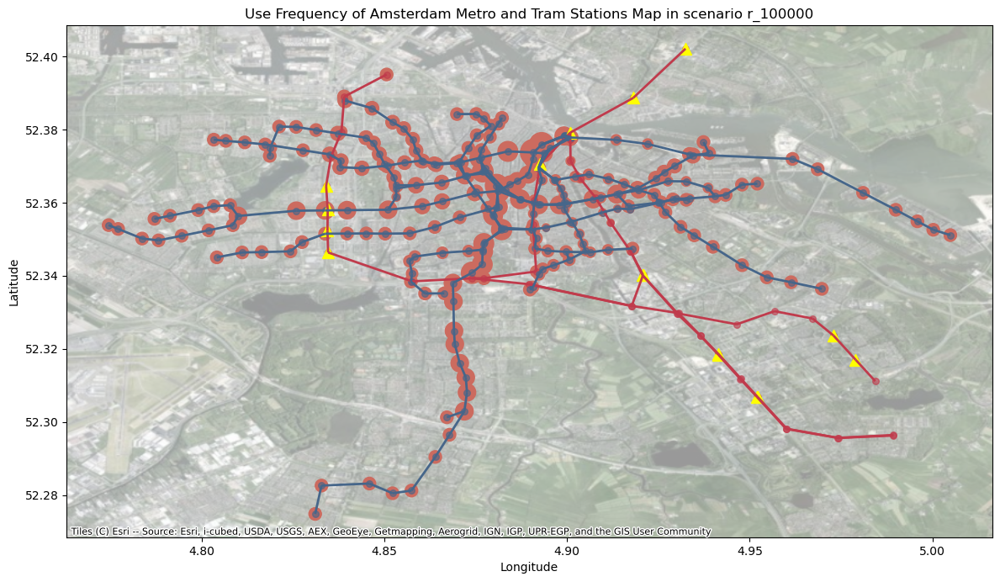

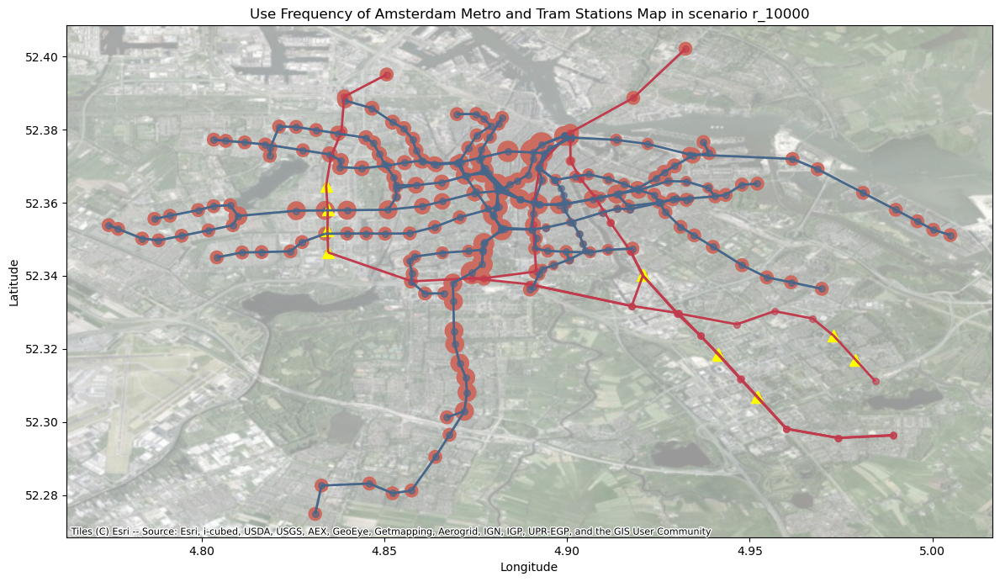

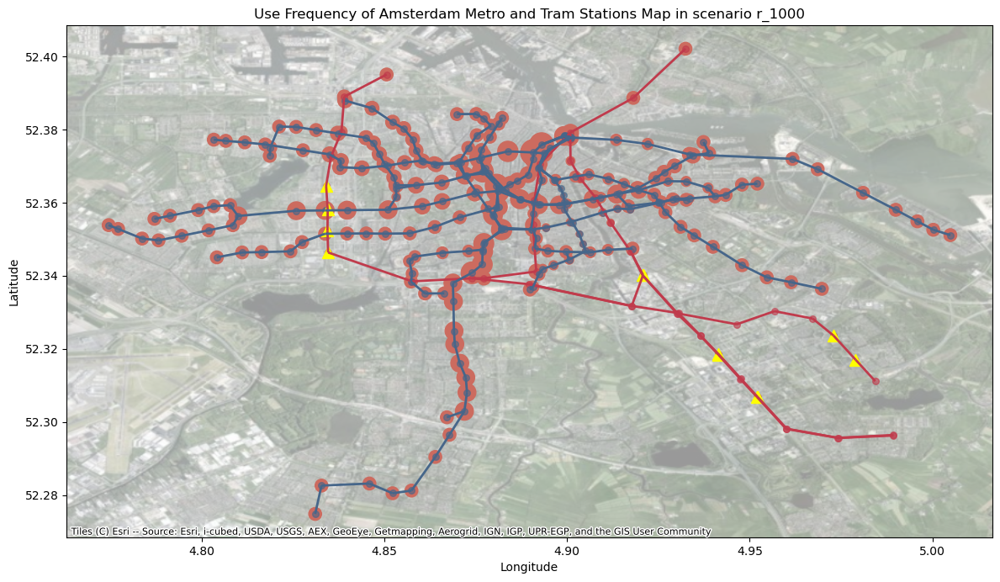

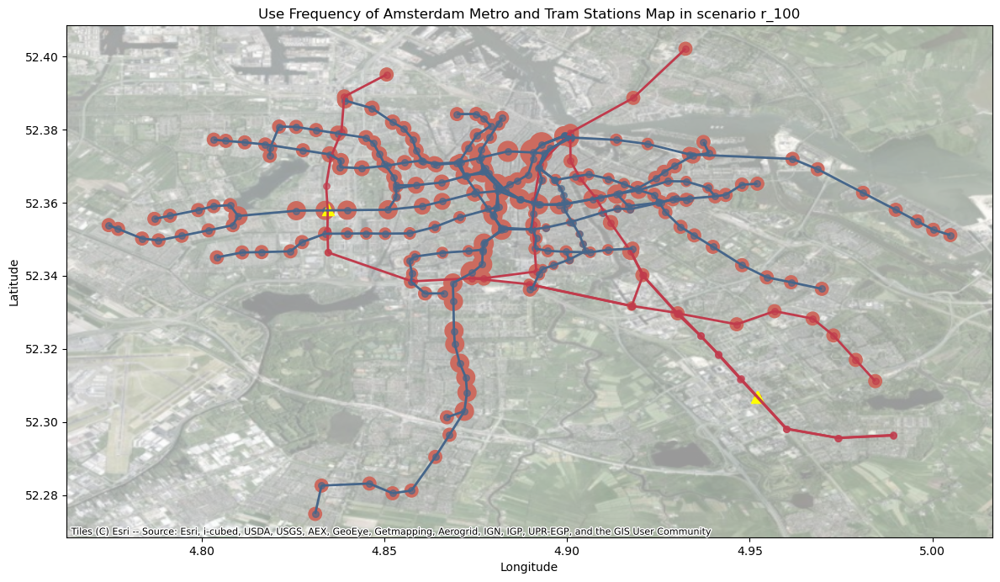

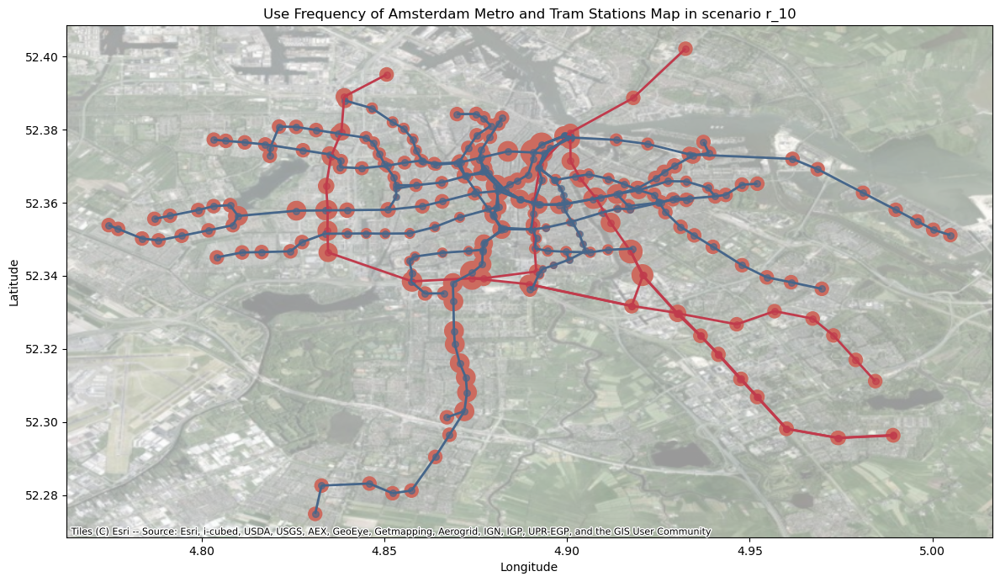

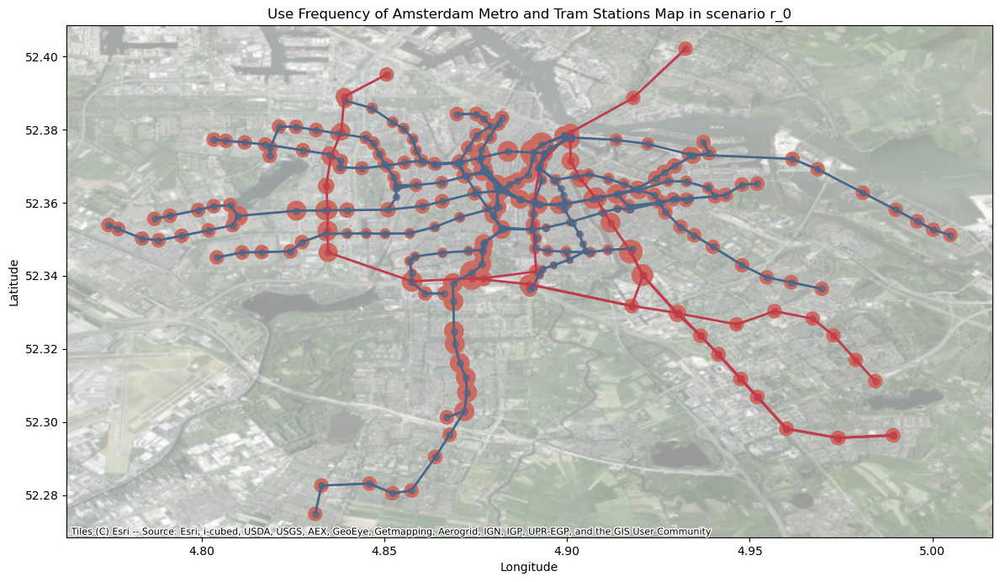

In [216]:
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as ctx
import matplotlib.colors as mcolors
import matplotlib.cm as cm
import pandas as pd

# 1. Normalize frequency values for shared color mapping
all_frequencies = pd.concat([df['frequency'] for df in stations_used_map_dict.values()])
norm = mcolors.Normalize(vmin=all_frequencies.min(), vmax=all_frequencies.max())

# 2. Loop through scenarios and create maps without legends
for scenario, node_infor_df in stations_used_map_dict.items():
    # Create GeoDataFrames
    city_sub_new_connected_edges_straight_line_gdf = gpd.GeoDataFrame(city_sub_new_connected_edges_straight_line.copy(), geometry='geometry')
    city_tram_new_connected_edges_straight_line_gdf = gpd.GeoDataFrame(city_tram_new_connected_edges_straight_line.copy(), geometry='geometry')
    
    # Create plot
    fig, ax = plt.subplots(1, 1, figsize=(12, 8))  # Adjusted size for better layout
    
    # Plot metro (subway) data
    subway_df = node_infor_df[node_infor_df.route == 'subway']
    subway_sizes = subway_df['frequency'] * 4
    subway_df.plot(ax=ax, markersize=subway_sizes, color='#CC6B5F', edgecolor='#CC6B5F', legend=False)
    
    # Plot tram data
    tram_df = node_infor_df[node_infor_df.route == 'tram']
    tram_sizes = tram_df['frequency'] * 4
    tram_df.plot(ax=ax, markersize=tram_sizes, color='#CC6B5F', edgecolor='#CC6B5F', legend=False)
    
    # Plot other layers
    city_sub_new_half_stations_straight_line_gdf.plot(color='#C03B4C', alpha=0.6, ax=ax, markersize=30, label='Subway Stations')
    city_tram_new_half_stations_straight_line_gdf.plot(color='#46668A', alpha=0.6, ax=ax, markersize=30, label='Tram Stations')
    city_sub_new_connected_edges_straight_line_gdf.plot(color='#C03B4C', ax=ax, linestyle='-', linewidth=2, label='Subway Lines')
    city_tram_new_connected_edges_straight_line_gdf.plot(color='#46668A', ax=ax, linestyle='-', linewidth=2, label='Tram Lines')
    # city_sub_new_connected_edges_straight_line_gdf.plot(color='red', alpha=0.4, ax=ax, linestyle='-', linewidth=2, label='Subway Lines')
    # city_tram_new_connected_edges_straight_line_gdf.plot(color='blue', alpha=0.4, ax=ax, linestyle='-', linewidth=2, label='Tram Lines')

    # Plot disrupted stations on top
    if scenario != 'r_0' and scenario != 'r_10':
        dis_station_gdf = gpd.GeoDataFrame(disrupted_stations_sub[scenario].copy(), geometry='geometry')
        dis_station_gdf.plot(color='#FFFF00', ax=ax, markersize=100, marker='^')
    
    # Add basemap
    metro_lines = gpd.read_file("./Metro lines.GPKG")
    ctx.add_basemap(ax=ax, crs=metro_lines.crs.to_string(), source=ctx.providers.Esri.WorldImagery, alpha=0.4)
    
    # Set title and labels
    ax.set_title(f'Use Frequency of Amsterdam Metro and Tram Stations Map in scenario {scenario}')
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')
    
    # Adjust layout
    plt.tight_layout()
    plt.show()

plt.show()